In [13]:
import os
import glob

import pandas as pd
import pytz
import datetime as dt
import math
import seaborn as sns
import matplotlib as mpl
#mpl.rcParams['path.simplify'] = False
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns


import biosppy
from biosppy import storage
from biosppy.signals import ecg


# misc
import warnings
import seaborn as sns

from matplotlib.patches import Ellipse

In [14]:
#signal processing
from scipy import signal
from scipy.ndimage import label
from scipy.stats import zscore
from scipy.interpolate import interp1d
from scipy.integrate import trapz

In [15]:

# style settings
sns.set(style='whitegrid', rc={'axes.facecolor': '#EFF2F7'})

In [16]:
def read_manipulate_psychopy(psychopy_path):
    
    psychopy_df = pd.read_csv(psychopy_path)
    col_list = [col for col in psychopy_df.columns if col.endswith('_ts')]
    col_list.insert(0, "Reference_time")
    psychopy_df_selected = psychopy_df[col_list]
    
    return psychopy_df_selected


def get_nonNan_list_psychopy(psychopy_df, col_name):
    
    
    selected_vals=[val for val in psychopy_df[col_name].to_list() if not(math.isnan(val))]
    
    return selected_vals


def get_offset_timestamp(timestamp, offset_mins):
    
    time_zone = 'Europe/Berlin'
    tz = pytz.timezone(time_zone)
    local_time = dt.datetime.fromtimestamp(timestamp, tz)
    time_change = dt.timedelta(minutes=offset_mins)
    new_time = local_time + time_change
    new_timestamp =  dt.datetime.timestamp(new_time)
    return new_timestamp


def read_shimmer_sensor(sensor_file_path):
    
    shimmer_df = pd.read_csv(sensor_file_path, sep='\t', low_memory=False)
    shimmer_df = shimmer_df.reset_index()
    shimmer_df.columns = shimmer_df.iloc[0]
    shimmer_df.drop([0, 1], axis=0, inplace=True)
    shimmer_df=shimmer_df.reset_index(drop=True)
    
    return shimmer_df


def slice_df_wrt_timestamps(df, start_timestamp, end_timestamp, timestamps_col):
    
    sliced_df=df[(df[timestamps_col]>= start_timestamp) & (df[timestamps_col] <= end_timestamp)]
    
    return sliced_df


def standardize_timestamps_shimmer(shimmer_df, timestamps_col_name):
    
    timesstamps_list = shimmer_df[timestamps_col_name].to_list()
    new_timestamps_list = [float(val)/1000 for val in  timesstamps_list]
    
    shimmer_df[timestamps_col_name] = new_timestamps_list
    
    return shimmer_df


def mean_std_col_df (df, col_name):
    
    col_list = df[col_name].to_list()
    
    cols_list_float = [float(val) for val in col_list]
    
    cols_list_float_np =np.array(cols_list_float)
    
    mean_col= np.mean(cols_list_float_np)
    std_col = np.std(cols_list_float_np)
    
    return mean_col, std_col


def plot_mean_std(mean_list, std_list, label_list, title_figure, y_label_fig):
    x_pos = np.arange(len(label_list))
    fig, ax = plt.subplots()
    ax.bar(x_pos, mean_list, yerr=std_list, align='center', alpha=0.5, capsize=10 )
    ax.set_ylabel(y_label_fig)
    ax.set_xticks(x_pos)
    ax.set_xticklabels(label_list, rotation=45, ha='right', rotation_mode='anchor')
    #title_ax = "VP001_251023_Session1_Shimmer_FBA7_Calibrated_SD"
    ax.set_title(title_figure)
    ax.yaxis.grid(True)
    #plt.ylim(0, 1) 
    plt.tight_layout()
    plt.show()
    return fig
    
    
def print_start_end_time(timestamp_col):
    
    time_stamp_list = timestamp_col.values
    start_timestamp = time_stamp_list[0]
    last_timestamp  = time_stamp_list[-1]
    
    time_zone = 'Europe/Berlin'
    tz = pytz.timezone(time_zone)
    
    start_time = dt.datetime.fromtimestamp(start_timestamp, tz)
    end_time  = dt.datetime.fromtimestamp(last_timestamp, tz)
    
    print("start time:" + str(start_time))
    print("end time:" + str(end_time))
    
    
    

def get_mean_std_event_list(psychopy_df, shimmer_df_selected, event_interest_list_new, offset_min_list_new, timestamp_sensor_col_name, data_col_name):

    mean_cumm_list = []
    std_cumm_list  = []
    event_interets_plot = []


    ##---outer loop to hnadle muultiple offsets from the selected events 
    for ind, event_selected in enumerate(event_interest_list_new):

        offset_list_selected_event = offset_min_list_new[ind]

        #print(event_selected)

        current_event_timestamp = get_nonNan_list_psychopy(psychopy_df, event_selected)[0]

        offset_min_list_selected = offset_min_list_new[ind]
        
        acc_min_print = 0

        for offset_min in offset_min_list_selected:
            
            offset_min_print = offset_min + acc_min_print
            
            acc_min_print = offset_min_print

            event_plot = event_selected +" "+ str(offset_min_print) + " min"
            event_interets_plot.append(event_plot)

            timestamp_offset = get_offset_timestamp(current_event_timestamp, offset_min)

            start_end_time_list = [current_event_timestamp, timestamp_offset]

            timestamp_start_slice = min(start_end_time_list)

            timestamp_end_slice = max(start_end_time_list)

            sensor_df_ii=slice_df_wrt_timestamps(shimmer_df_selected, timestamp_start_slice, timestamp_end_slice, timestamp_sensor_col_name)

            mean_val, std_val = mean_std_col_df(sensor_df_ii, data_col_name) 
            mean_cumm_list.append(mean_val)
            std_cumm_list.append(std_val)




            current_event_timestamp = timestamp_offset
            
            
            
    return mean_cumm_list, std_cumm_list, event_interets_plot


def normalize_data (std_df, signal_col):
    
    
    signal = std_df[signal_col].to_list()
    
    
    signal_float =[float(val) for val in signal]
    
    signal_float_np = np.array(signal_float)
    
    
    mean_signal = np.mean(signal_float_np)
    
    mean_sub = signal_float_np - mean_signal
    
    scaled_data =  mean_sub/np.max(np.abs(mean_sub))
    
    std_df["mean_norm"] = scaled_data
    
    return std_df


def normalize_data_min_max (std_df, signal_col):
    
    
    signal = std_df[signal_col].to_list()
    
    
    signal_float =[float(val) for val in signal]
    
    signal_float_np = np.array(signal_float)
    
    
    min_val = np.min(signal_float_np)
    max_val = np.max(signal_float_np)
    
    range_val = max_val-min_val
    
    
    min_sub = signal_float_np - min_val
    
    scaled_data = min_sub/range_val
    
    
    std_df["min_max_norm"] = scaled_data
    
    return std_df
    

## Frequency Domain analysis

In [17]:
def from_rr_to_rr_interpolated(rr_msec, fs = 4):
    #create interpolation function based on the r-r samples
    
    # sample in seconds(x-axis)
    x = np.cumsum(rr_msec)/1200 
    f = interp1d(x, rr_msec, kind='cubic')
    
    steps = 1/fs
    
    # now we can sample from interpolation function
    xx = np.arange(1, np.max(x), steps)
    rr_interpolated_msec = f(xx)
    
    return rr_interpolated_msec

def frequency_domain_rr(rri, fs=4):
    # rri: rr interpolated
    # Estimate the spectral density using Welch's method
    fxx, pxx = signal.welch(x=rri, fs=fs)
    
    '''
    Segement found frequencies in the bands 
     - Very Low Frequency (VLF): 0-0.04Hz 
     - Low Frequency (LF): 0.04-0.15Hz 
     - High Frequency (HF): 0.15-0.4Hz
    '''
    cond_vlf = (fxx >= 0) & (fxx < 0.04)
    cond_lf = (fxx >= 0.04) & (fxx < 0.15)
    cond_hf = (fxx >= 0.15) & (fxx < 0.4)
    
    # calculate power in each band by integrating the spectral density 
    vlf = trapz(pxx[cond_vlf], fxx[cond_vlf])
    lf = trapz(pxx[cond_lf], fxx[cond_lf])
    hf = trapz(pxx[cond_hf], fxx[cond_hf])
    
    # sum these up to get total power
    total_power = vlf + lf + hf

    # find which frequency has the most power in each band
    peak_vlf = fxx[cond_vlf][np.argmax(pxx[cond_vlf])]
    peak_lf = fxx[cond_lf][np.argmax(pxx[cond_lf])]
    peak_hf = fxx[cond_hf][np.argmax(pxx[cond_hf])]

    # fraction of lf and hf
    lf_nu = 100 * lf / (lf + hf)
    hf_nu = 100 * hf / (lf + hf)
    
    results = {}
    results['Power VLF (ms2)'] = vlf
    results['Power LF (ms2)'] = lf
    results['Power HF (ms2)'] = hf   
    results['Power Total (ms2)'] = total_power

    results['LF/HF'] = (lf/hf)
    results['Peak VLF (Hz)'] = peak_vlf
    results['Peak LF (Hz)'] = peak_lf
    results['Peak HF (Hz)'] = peak_hf

    results['Fraction LF (nu)'] = lf_nu
    results['Fraction HF (nu)'] = hf_nu
    return results, fxx, pxx

In [18]:
def plot_rr_inerval_distribution(rr_msec):
    
    plt.figure()
    plt.figure(figsize=(20, 7))
    font_size = 18
    font_size_title = 24
    
    plt.title("Distribution of RR-intervals", fontsize=font_size_title)
    with warnings.catch_warnings():
        warnings.simplefilter("ignore") # ignore FutureWarning 
        sns.kdeplot(rr_msec, label="rr-intervals", color="#A651D8", shade=True)


    outlier_low = np.mean(rr_msec) - 1 * np.std(rr_msec)
    outlier_high = np.mean(rr_msec) + 1 * np.std(rr_msec)
    plt.axvline(x=outlier_low, color= "green")
    plt.axvline(x=outlier_high, color= "green")

    plt.axvline(x=np.mean(rr_msec))
    #plt.text(outlier_low - 370, 0.004, "outliers low (< mean - 2 sigma)")
    #plt.text(outlier_high + 20, 0.004, "outliers high (> mean + 2 sigma)")

    plt.xlabel("RR-interval (ms)", fontsize=font_size)
    plt.ylabel("Density", fontsize=font_size)
    plt.tick_params(axis='both', which='major', labelsize=font_size)

    plt.legend()
    plt.show()
    
    
    
def plot_fft_spectrum(rr_msec_interpolated):
    font_size = 18
    font_size_title = 24
    
    results, fxx, pxx = frequency_domain_rr(rr_msec_interpolated)
    plt.figure(figsize=(20, 7))
    plt.plot(fxx, pxx, color="k", linewidth=0.3)
    plt.title("FFT Spectrum (Welch's periodogram)", fontsize=font_size_title)

    # create interpolation function for plotting frequency bands
    psd_f = interp1d(fxx, pxx)

    # setup frequency bands for plotting
    x_vlf = np.linspace(0, 0.04, 100)
    x_lf = np.linspace(0.04, 0.15, 100)
    x_hf = np.linspace(0.15, 0.4, 100)

    plt.gca().fill_between(x_vlf, psd_f(x_vlf), alpha=0.2, color="#A651D8", label="VLF")
    plt.gca().fill_between(x_lf, psd_f(x_lf), alpha=0.2, color="#51A6D8", label="LF")
    plt.gca().fill_between(x_hf, psd_f(x_hf), alpha=0.2, color="#D8A651", label="HF")

    plt.gca().set_xlim(0, 0.5)
    plt.gca().set_ylim(0)
    plt.xlabel("Frequency (Hz)", fontsize=font_size)
    plt.ylabel("Density", fontsize=font_size)
    plt.legend(fontsize=16)
    plt.tick_params(axis='both', which='major', labelsize=font_size)
    plt.show()
    

## Time Domain analysis functions 

In [19]:
def col_from_str_float (df, col_name):
    
    str_list = df[col_name].values
    
    float_array =[float(val) for val in str_list]
    
    df[col_name] = float_array
    
    return df


def remove_outliers_rri(r_peaks, sampling_freq = 256):
    
    # RR-intervals are the differences between successive peaks
    r_peaks_sec = r_peaks*1/sampling_freq
    r_peaks_msec = r_peaks_sec*1000

    r_peaks_diff=np.diff(r_peaks_msec)
    
    rr_corrected = r_peaks_diff.copy()

    rr_corrected[np.abs(zscore(r_peaks_diff)) > 2] = np.median(r_peaks_diff)
    
    return rr_corrected



def filter_rr(rr, throshold_high=0.5, threshold_low=0.5):
    
    #outlier_high = np.mean(rr) + throshold_high * np.std(rr)
    outlier_high =1200
    #print(outlier_high)
    
    rr_clean_high = [rr_val for rr_val in rr if rr_val <  outlier_high]
    
    rr_clean_high = np.array(rr_clean_high)
    
    #outlier_low = np.mean(rr_clean_high) - threshold_low*np.std(rr_clean_high)
    outlier_low = 400
    #print(outlier_low)
    
    rr_clean_high_low = [rr_val for rr_val in rr_clean_high if rr_val >  outlier_low]
    
    rr_clean_high_low= np.array(rr_clean_high_low)
    
    return rr_clean_high_low


def timedomain(rr):
    results = {}

    hr = 60000/rr
    
    results['Mean RR (ms)'] = np.mean(rr)
    results['STD RR/SDNN (ms)'] = np.std(rr)
    #results['Mean HR (Kubios\' style) (beats/min)'] = 60000/np.mean(rr)
    results['Mean HR (beats/min)'] = np.mean(hr)
    results['STD HR (beats/min)'] = np.std(hr)
    results['Min HR (beats/min)'] = np.min(hr)
    results['Max HR (beats/min)'] = np.max(hr)
    results['RMSSD (ms)'] = np.sqrt(np.mean(np.square(np.diff(rr))))
    results['NNxx'] = np.sum(np.abs(np.diff(rr)) > 50)*1
    results['pNNxx (%)'] = 100 * np.sum((np.abs(np.diff(rr)) > 50)*1) / len(rr)
    return results







def get_features_from_ecg(psychopy_df, shimmer_df_selected, event_interest_list_new, offset_min_list_new, timestamp_sensor_col_name, data_col_name):

    mean_cumm_list = []
    std_cumm_list  = []
    event_interets_plot = []
    
    
    vlf_list=[]
    lf_list = []
    hf_list=[]
    
    mean_hrv_list = []
    std_hrv_list = []
    
    mean_bpm_list = []
    std_bpm_list = []
    
    rmsssd_list = []
    
    all_rr_one_list = []
    all_rr_sublist = []


    ##---outer loop to hnadle muultiple offsets from the selected events 
    for ind, event_selected in enumerate(event_interest_list_new):

        offset_list_selected_event = offset_min_list_new[ind]

        #print(event_selected)

        current_event_timestamp = get_nonNan_list_psychopy(psychopy_df, event_selected)[0]

        offset_min_list_selected = offset_min_list_new[ind]
        
        acc_min_print = 0

        for offset_min in offset_min_list_selected:
            
            offset_min_print = offset_min + acc_min_print
            
            acc_min_print = offset_min_print

            event_plot = event_selected +" "+ str(offset_min_print) + " min"
            
            #print(event_plot)
            
            event_interets_plot.append(event_plot)

            timestamp_offset = get_offset_timestamp(current_event_timestamp, offset_min)

            start_end_time_list = [current_event_timestamp, timestamp_offset]

            timestamp_start_slice = min(start_end_time_list)

            timestamp_end_slice = max(start_end_time_list)

            sensor_df_ii=slice_df_wrt_timestamps(shimmer_df_selected, timestamp_start_slice, timestamp_end_slice, timestamp_sensor_col_name)
            
            ecg_df_ii=sensor_df_ii.reset_index(drop=True)
            
            ecg_slice = ecg_df_ii[data_col_name].values
            
            out = ecg.ecg(signal=ecg_slice, sampling_rate=256, show=False,interactive=False)
            
            r_peaks = out["rpeaks"]
            
            r_peaks_diff = remove_outliers_rri(r_peaks, sampling_freq = 256)
            
            r_peaks_diff=filter_rr(r_peaks_diff)
            
            
            time_domain_features = timedomain(r_peaks_diff)
            ##---------------------------------------------------------------
            r_peaks_interpolated = from_rr_to_rr_interpolated(r_peaks_diff)
            freq_domain_features, fxx, pxx=frequency_domain_rr(r_peaks_interpolated)
            ####-------------------
            
            vlf_event =freq_domain_features["Power VLF (ms2)"]
            lf_event =freq_domain_features["Power LF (ms2)"]
            hf_event =freq_domain_features["Power HF (ms2)"]
            
            vlf_list.append(vlf_event)
            lf_list.append(lf_event)
            hf_list.append(hf_event)
            
            mean_bpm_event = time_domain_features["Mean HR (beats/min)"]
            std_bpm_event  = time_domain_features["STD HR (beats/min)"]
            mean_hrv_event = time_domain_features["Mean RR (ms)"]
            std_hrv_event = time_domain_features["STD RR/SDNN (ms)"]
            rmssd_event = time_domain_features["RMSSD (ms)"]
            
            
            mean_hrv_list.append(mean_hrv_event)
            std_hrv_list.append(std_hrv_event)
            
            mean_bpm_list.append(mean_bpm_event)
            std_bpm_list.append(std_bpm_event)
            
            rmsssd_list.append(rmssd_event)
            
            
            
            
            
            
            #print(timedomain(r_peaks_diff))
            
            cleaned_rr=r_peaks_diff
            mean_rr = np.mean(cleaned_rr) 
            std_rr = np.std(cleaned_rr)
            
            #mean_cumm_list.append(mean_rr)
            #std_cumm_list.append(std_rr)
            
            
            all_rr_one_list.extend(cleaned_rr)
            all_rr_sublist.append(cleaned_rr)
            
            
            current_event_timestamp = timestamp_offset
            
            
            
            
            

            #mean_val, std_val = mean_std_col_df(sensor_df_ii, data_col_name) 
            #mean_cumm_list.append(mean_val)
            #std_cumm_list.append(std_val)
            #current_event_timestamp = timestamp_offset
            
            
            
    return vlf_list, lf_list, hf_list, rmsssd_list, mean_hrv_list, std_hrv_list, mean_bpm_list, std_bpm_list, event_interets_plot, all_rr_one_list, all_rr_sublist


In [20]:
data_dir_path = "/home/muhammad/Desktop/Datasets/data_sony_digiRelax/wp3"
#data_dir_path = "D:/Datasets/data_sony_digiRelax/new_participants/"
sub_dirs=next(os.walk(data_dir_path))[1]
sub_dirs=sorted(sub_dirs)

In [21]:
print(sub_dirs)

['VP004_081123', 'VP005_081123', 'VP006_091123', 'VP007_091123', 'VP008_101123', 'VP009_101123', 'VP010_131123', 'VP011_131123', 'VP012_141123', 'VP013_151123', 'VP014_151123', 'VP015_161123', 'VP016_161123', 'VP017_171123', 'VP018_201123', 'VP019_201123', 'VP020_221123', 'VP021_221123', 'VP022_231123', 'VP023_231123', 'VP024_241123', 'VP025_271123', 'VP026_271123', 'VP027_271123', 'VP028_281123', 'VP029_281123', 'VP030_291123', 'VP031_291123', 'VP032_301123', 'VP033_301123', 'VP034_011223', 'VP035_041223', 'VP037_051223', 'VP038_051223', 'VP039_061223', 'VP040_061223', 'VP041_061223', 'VP042_071223', 'VP043_071223', 'VP044_071223', 'VP045_081223', 'VP046_081223', 'VP047_111223', 'VP048_121223', 'VP049_121223', 'VP050_131223', 'VP051_131223', 'VP052_131223', 'VP053_141223', 'VP054_141223', 'VP055_141223', 'VP056_151223', 'VP057_151223', 'VP059_181223', 'VP060_191223', 'VP063_040124', 'VP064_050124', 'VP065_050124', 'VP066_080124', 'VP067_100124', 'VP068_100124', 'VP069_110124', 'VP070_

## Psychopy event of interest and offset/onset

In [22]:
event_interest_list_new = ["baseline_instruction_ts", "tsst_prep_ts", "tsst_pres_ts", "relaxation_prep_ts"]
offset_min_list_new  = [[3], [5], [5,5], [5, 5, 5]]

In [23]:
#dest_path = "D:/Datasets/data_sony_digiRelax/anal_skin_conductance"
dest_path ="/home/muhammad/Desktop/repos_ixp/tester_sony_digirelax/results/final_report_results"
designated_folder = "not_normalized"
comp_dest_path = os.path.join(dest_path, designated_folder)

isexist = os.path.exists(comp_dest_path)

if not isexist:
    os.makedirs(comp_dest_path)
    print("The new directory is created")


VP004_081123_DigiRelax_Experiment_2023-11-08_10h28.36.317


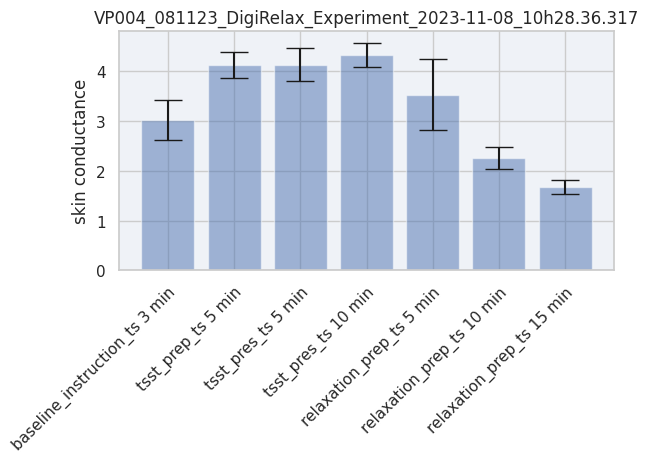

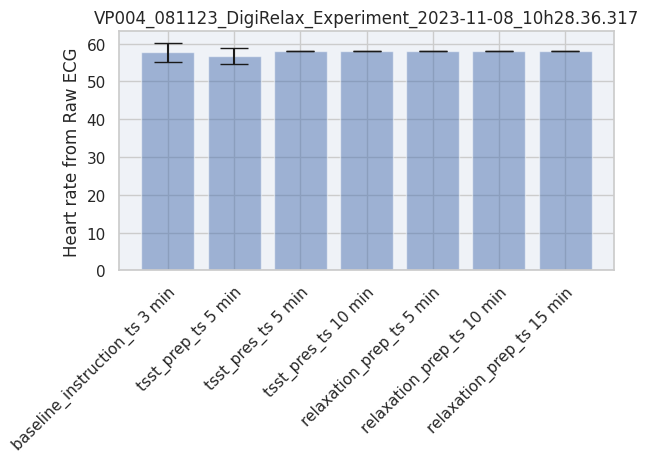

VP005_081123_DigiRelax_Experiment_2023-11-08_14h17.35.226


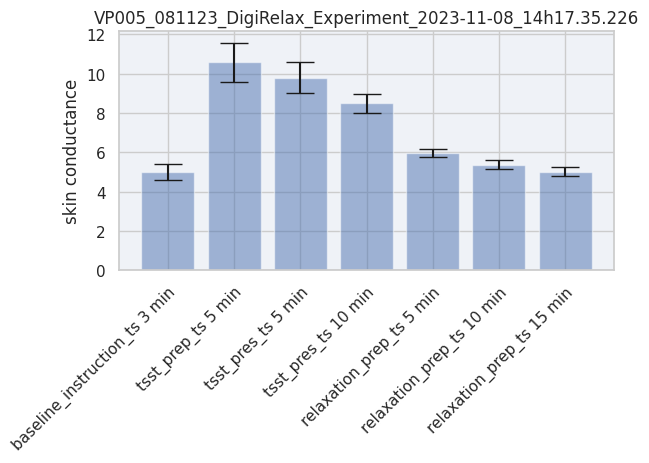

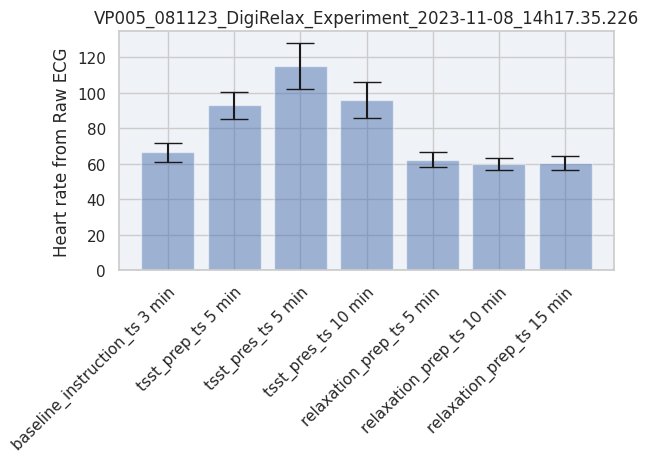

VP006_091123_DigiRelax_Experiment_2023-11-09_10h17.40.415


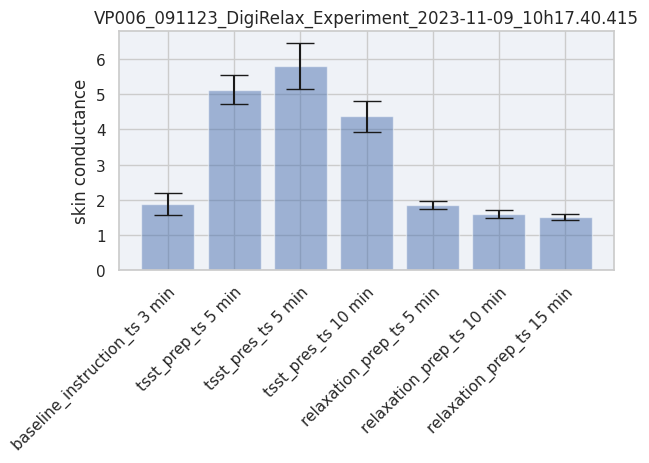

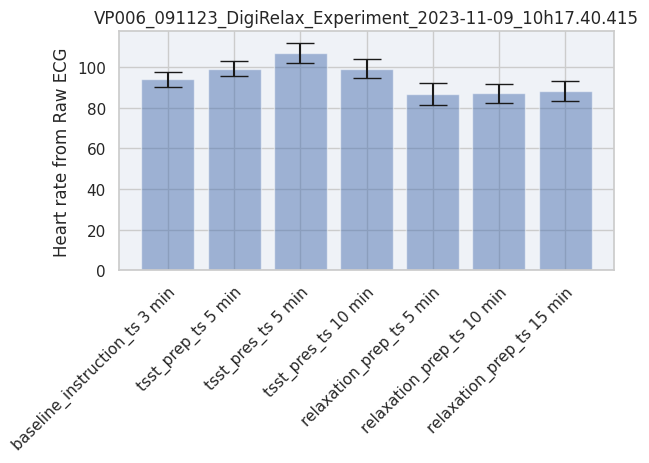

VP007_091123_DigiRelax_Experiment_2023-11-09_14h19.56.411


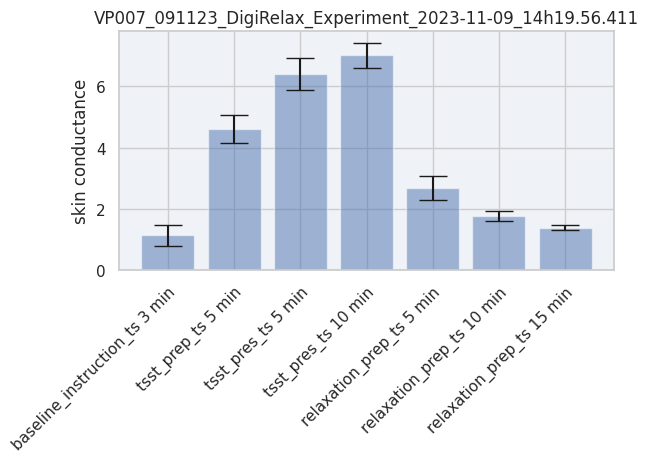

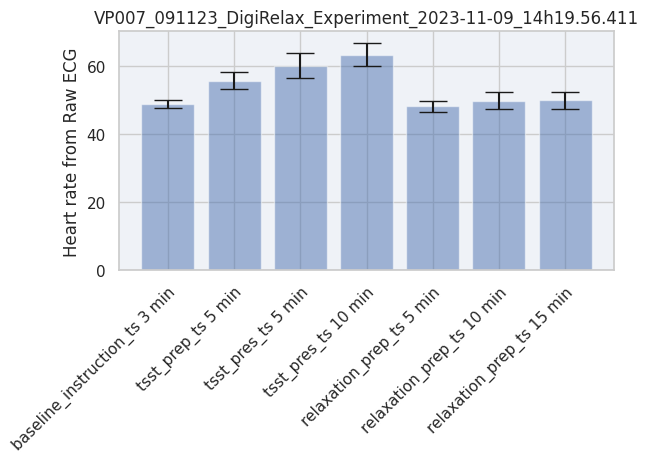

VP008_101123_DigiRelax_Experiment_2023-11-10_10h24.14.323


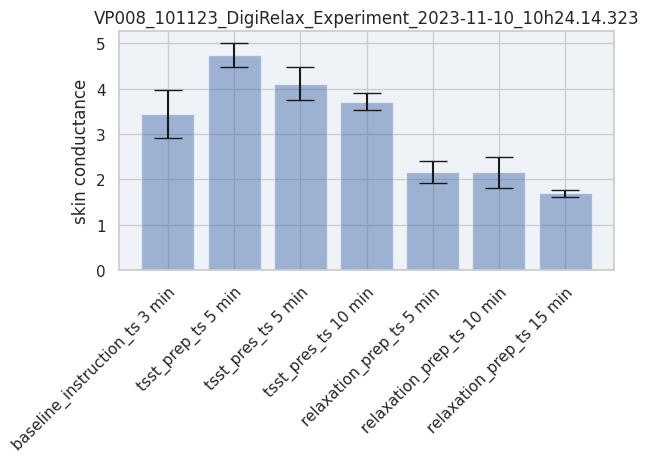

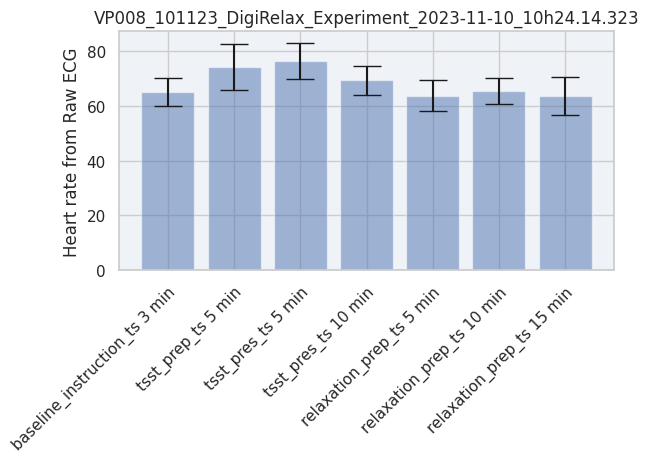

VP009_101123_DigiRelax_Experiment_2023-11-10_14h16.47.223


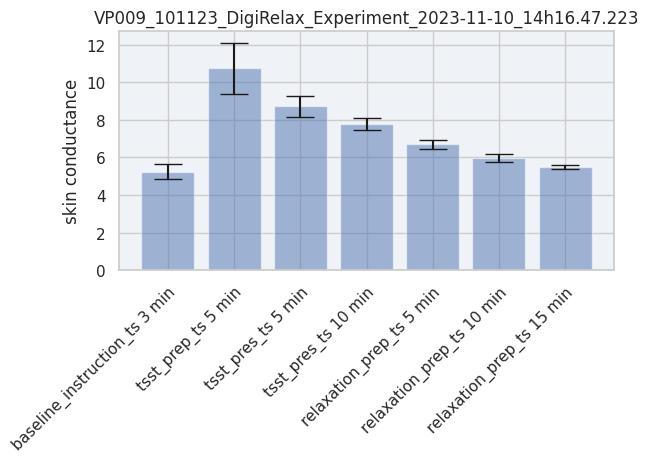

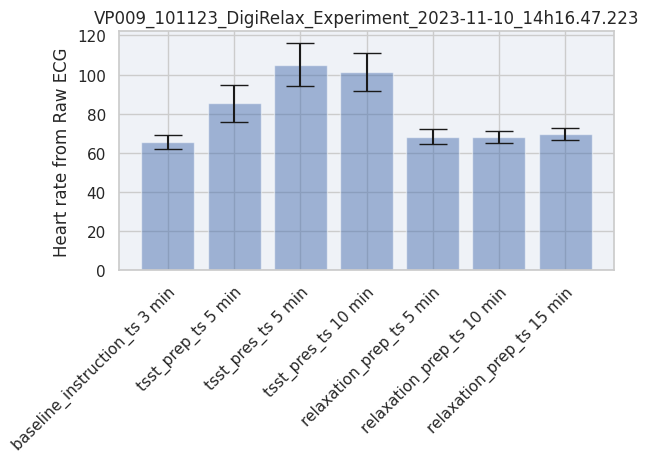

VP010_131123_DigiRelax_Experiment_2023-11-13_09h54.08.913


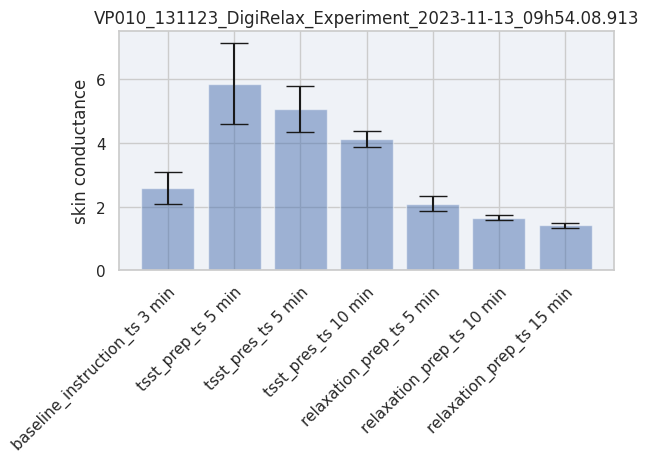

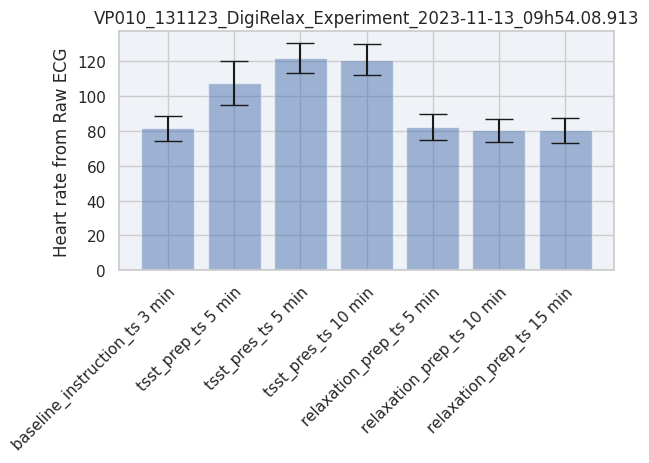

VP011_131123_DigiRelax_Experiment_2023-11-13_14h42.51.249


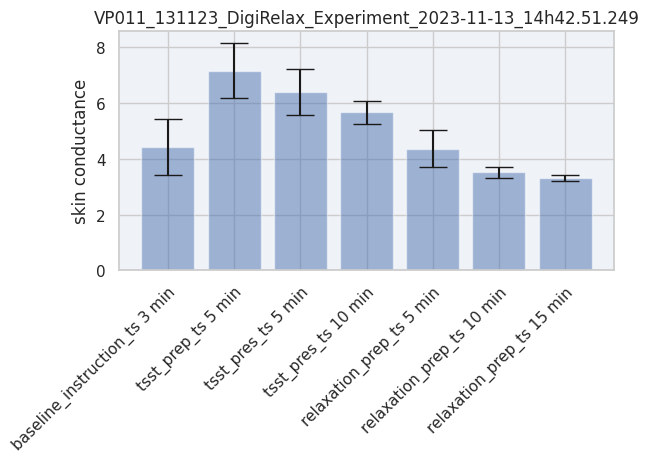

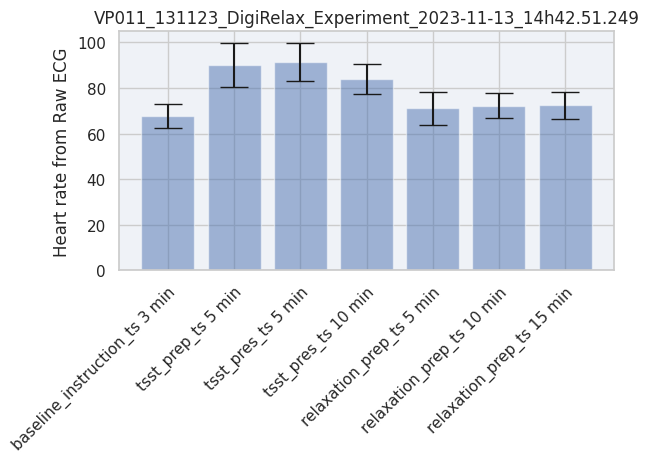

VP012_141123_DigiRelax_Experiment_2023-11-14_09h47.48.508


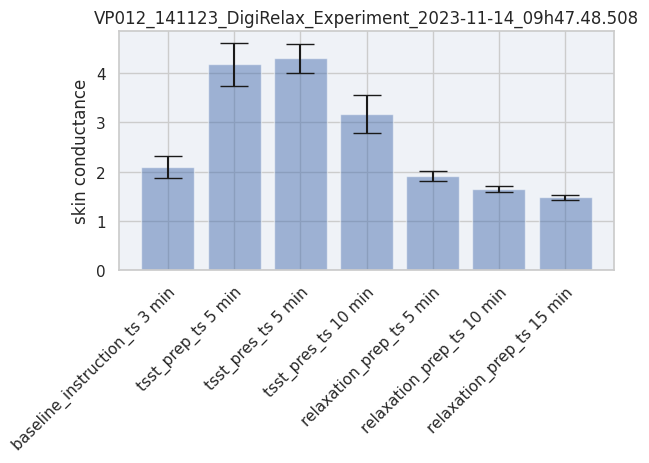

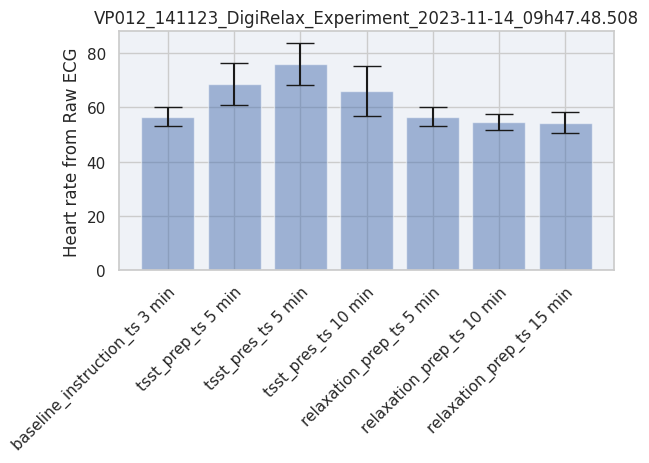

VP013_151123_DigiRelax_Experiment_2023-11-15_09h52.50.734


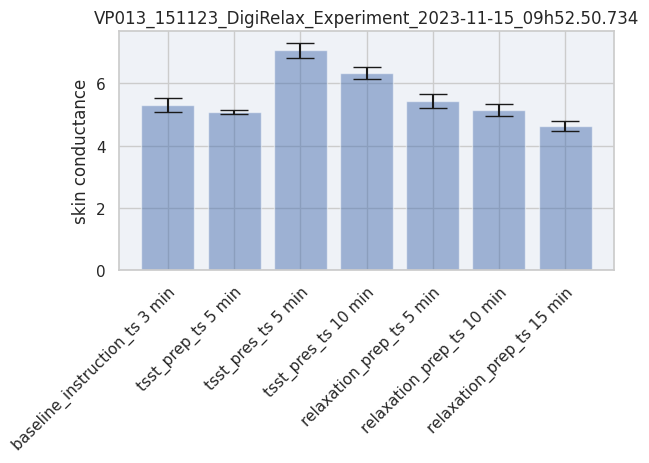

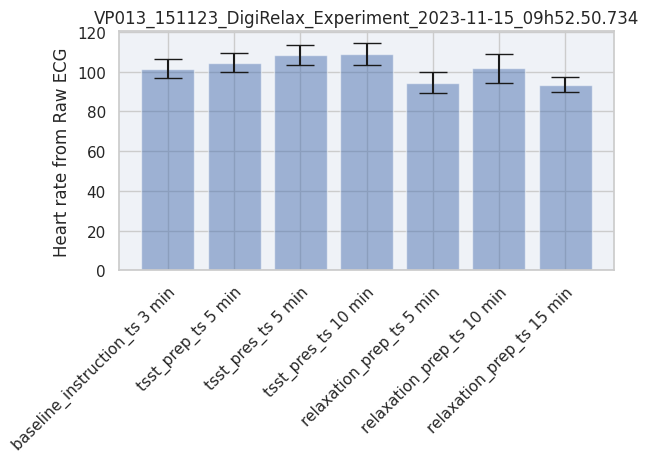

VP014_151123_DigiRelax_Experiment_2023-11-15_14h23.06.117


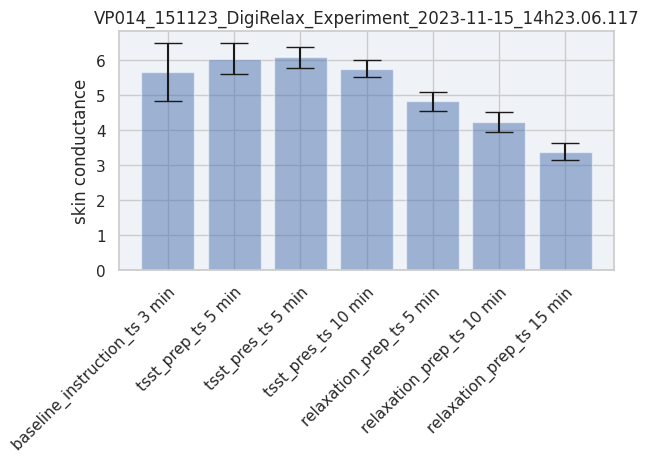

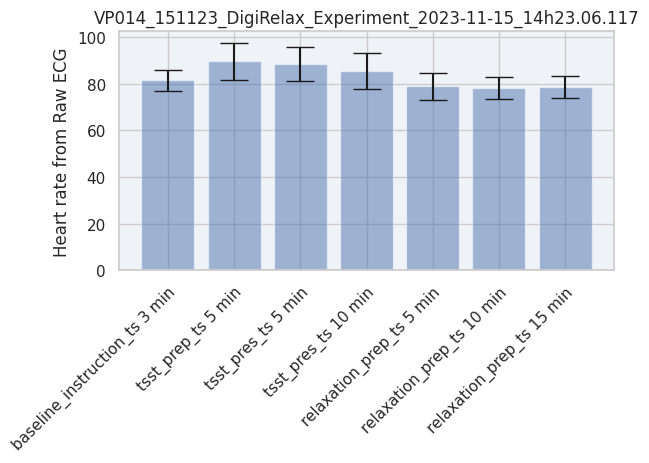

VP015_161123_DigiRelax_Experiment_2023-11-16_09h47.53.124


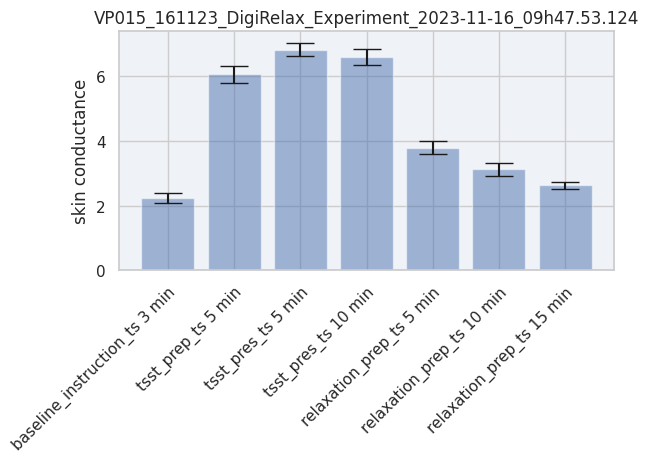

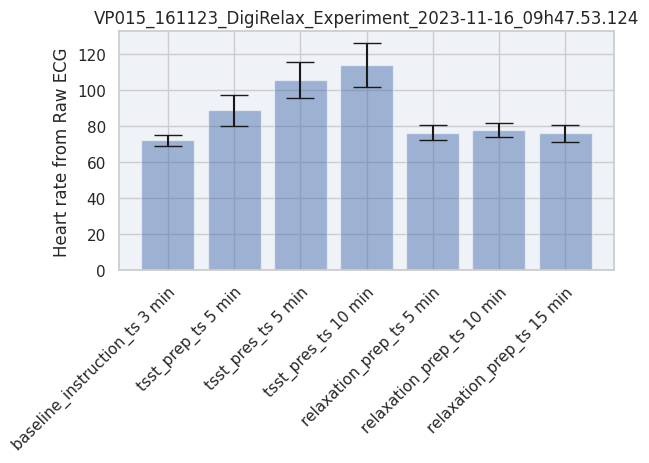

VP016_161123_DigiRelax_Experiment_2023-11-16_14h46.57.355


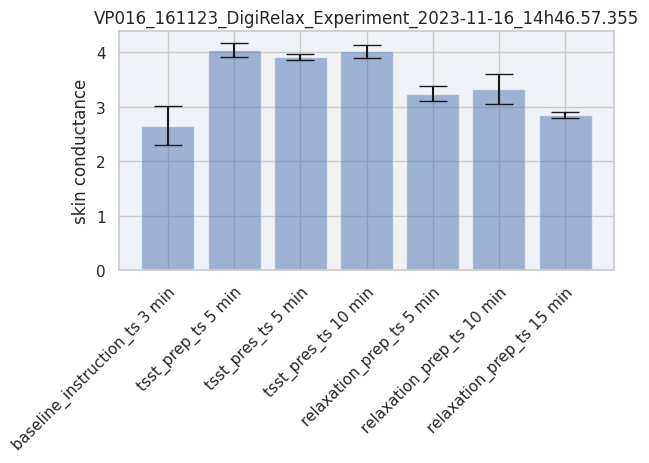

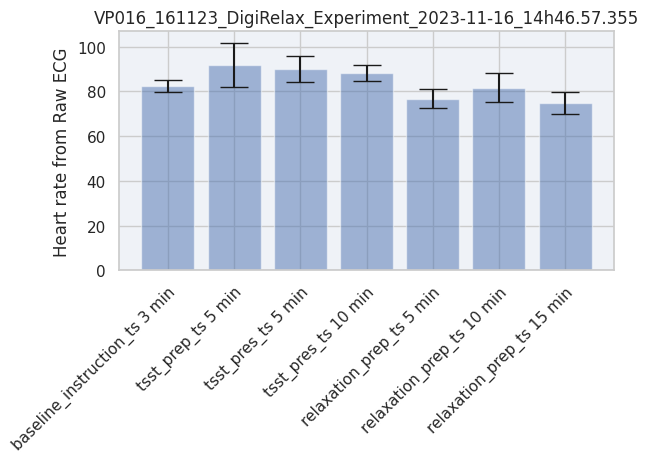

VP017_171123_DigiRelax_Experiment_2023-11-17_14h43.13.415


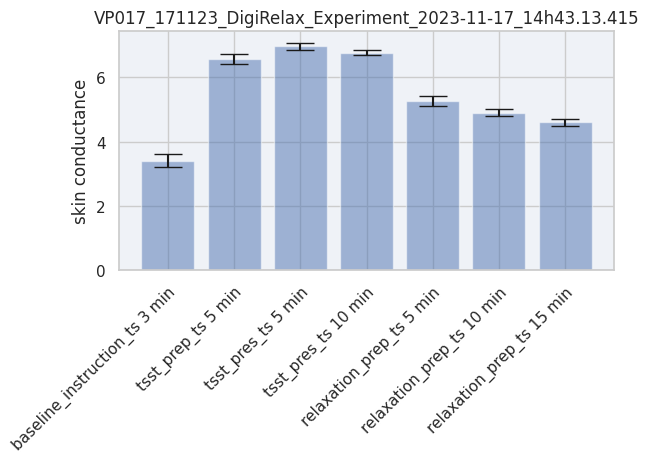

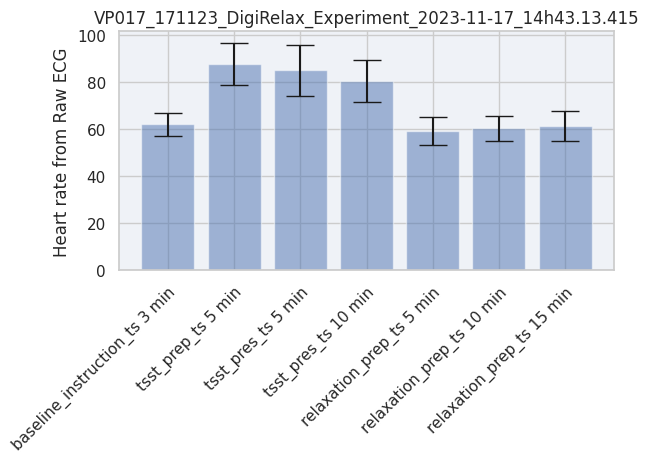

VP018_201123_DigiRelax_Experiment_2023-11-20_09h51.59.612


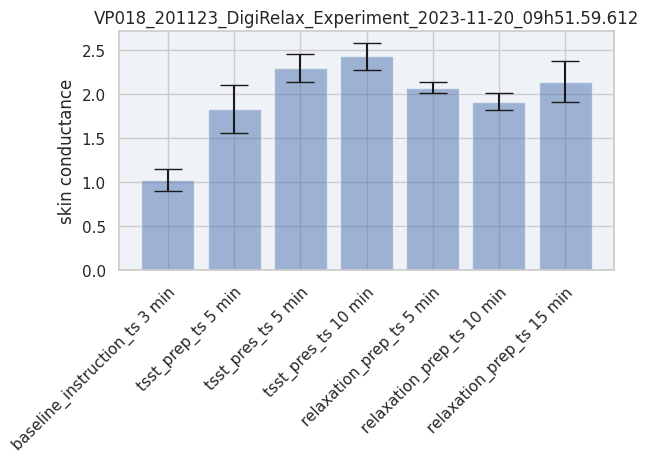

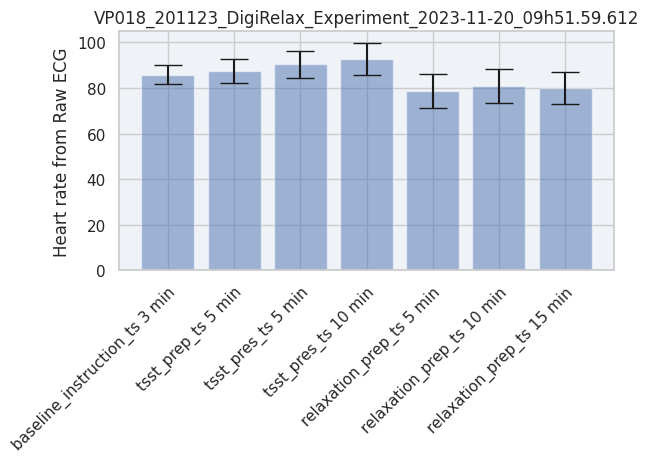

VP019_201123_DigiRelax_Experiment_2023-11-20_14h48.37.367


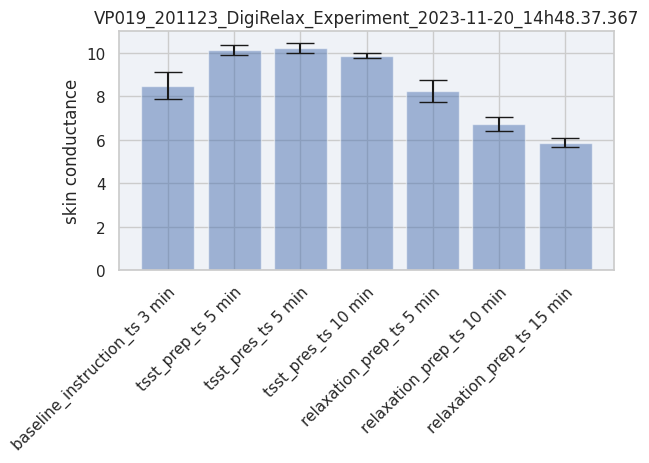

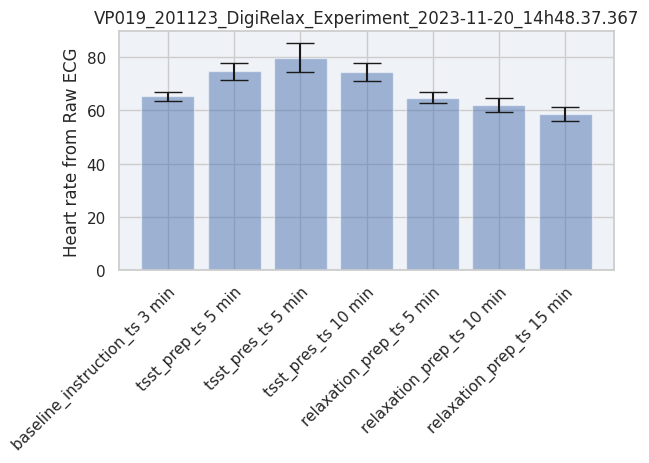

VP020_221123_DigiRelax_Experiment_2023-11-22_09h48.04.766


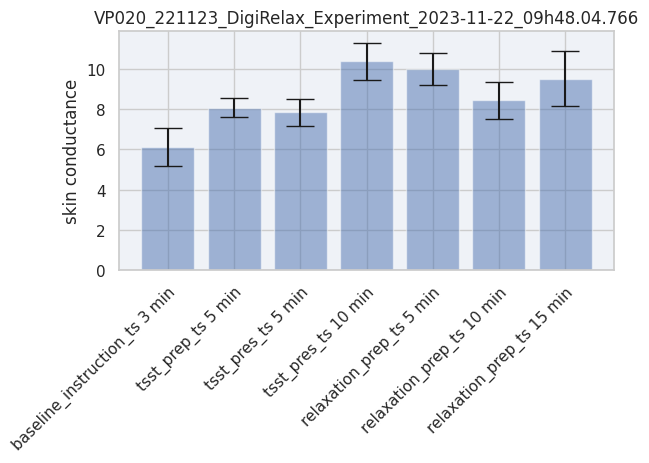

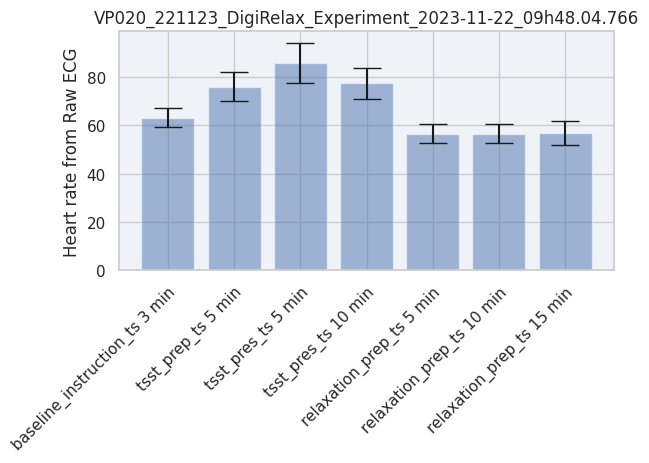

VP021_221123_DigiRelax_Experiment_2023-11-22_14h43.57.344


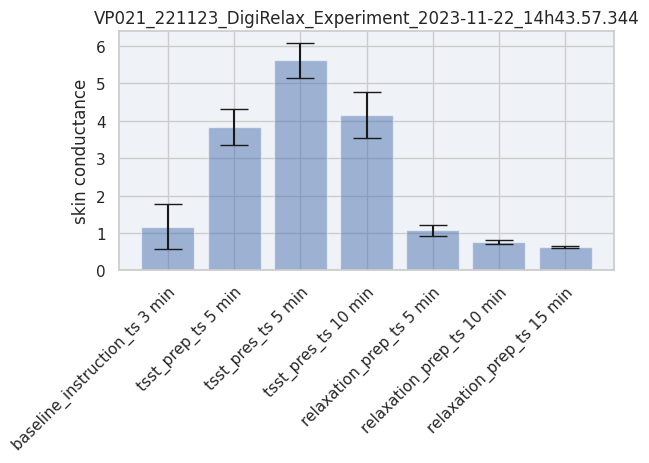

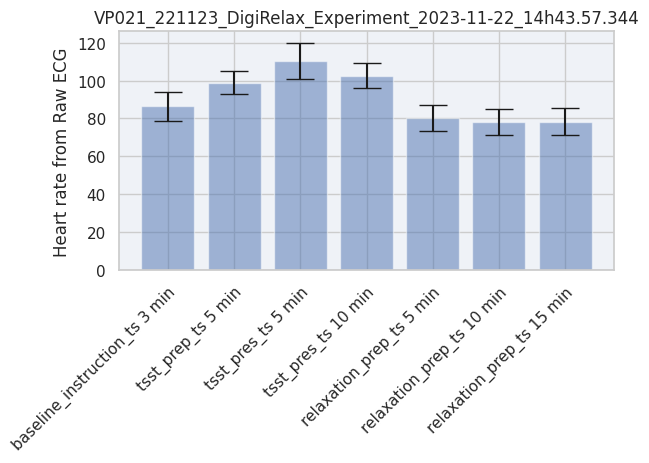

VP022_231123_DigiRelax_Experiment_2023-11-23_09h47.27.026


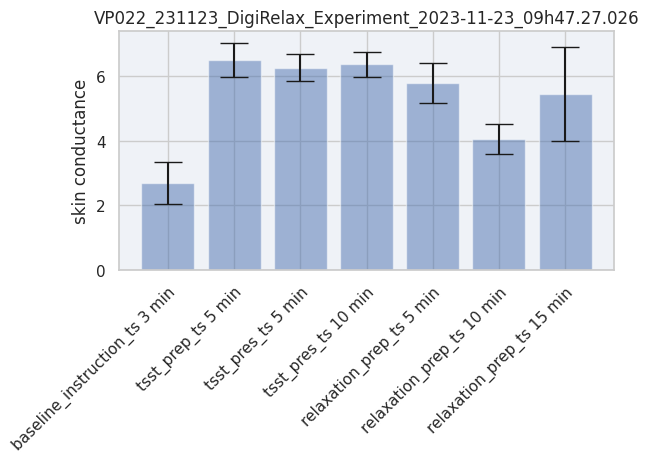

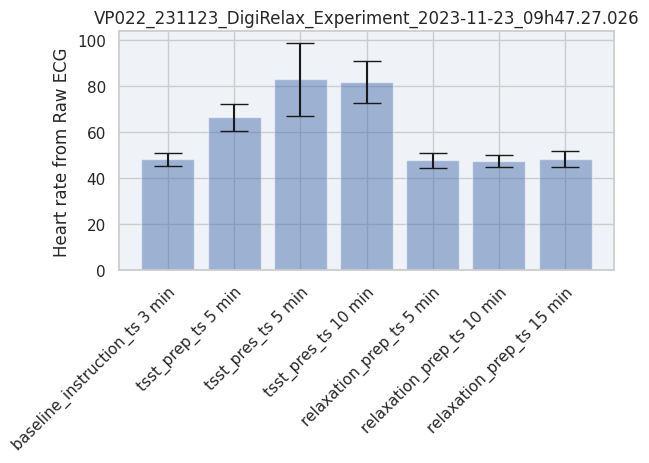

VP023_231123_DigiRelax_Experiment_2023-11-23_14h49.16.111


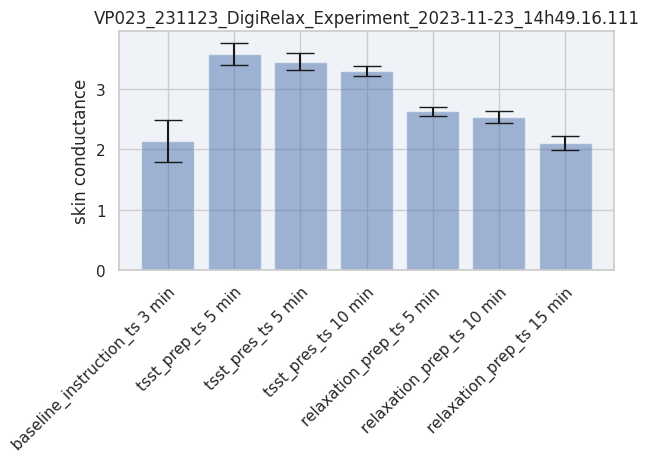

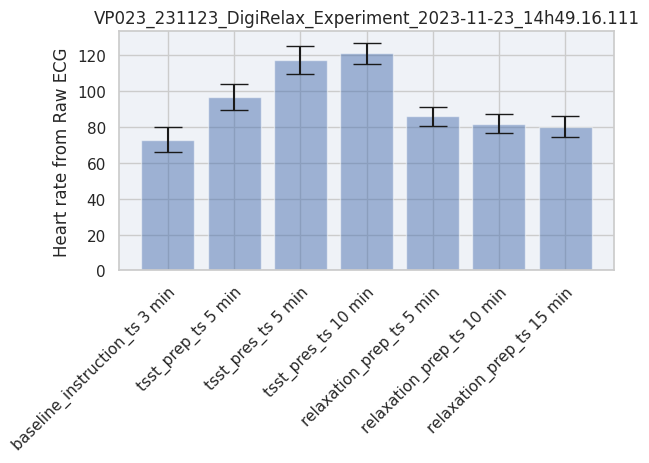

VP024_241123_DigiRelax_Experiment_2023-11-24_15h57.15.078


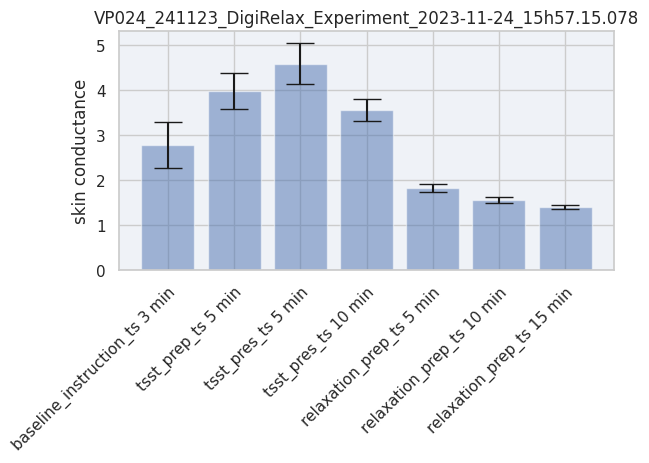

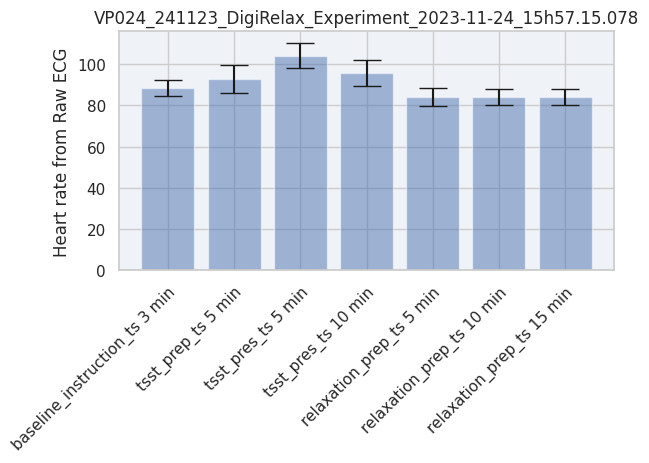

VP025_271123_DigiRelax_Experiment_2023-11-27_09h46.03.287


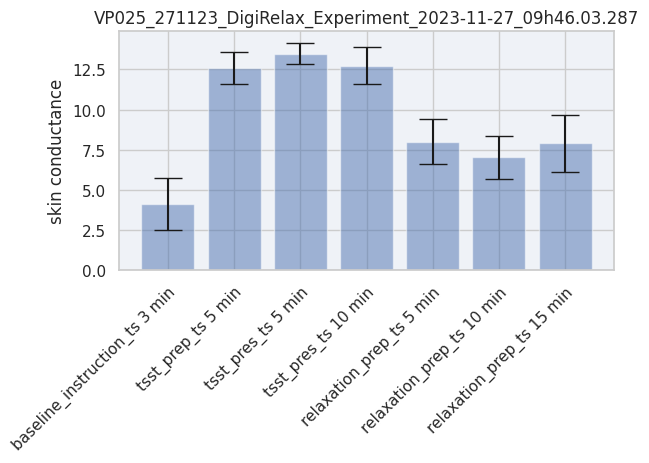

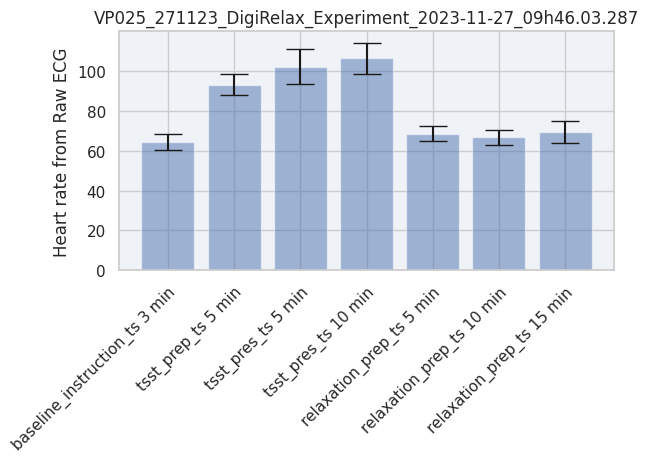

VP26_271123_DigiRelax_Experiment_2023-11-27_13h16.52.357


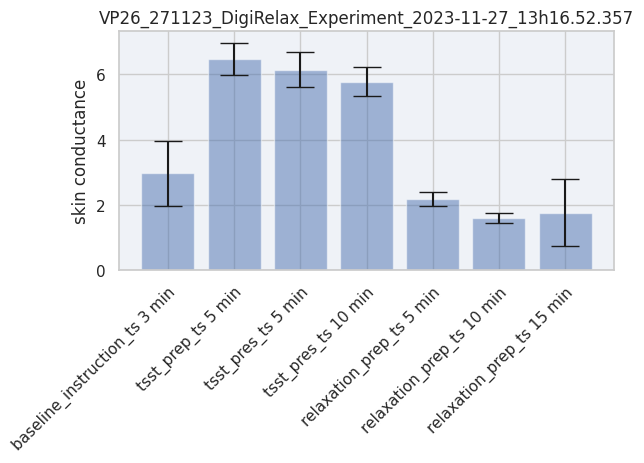

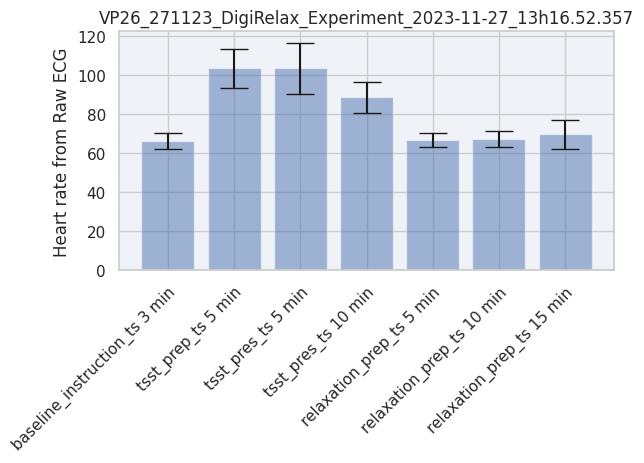

VP027_271123_DigiRelax_Experiment_2023-11-27_15h58.18.227


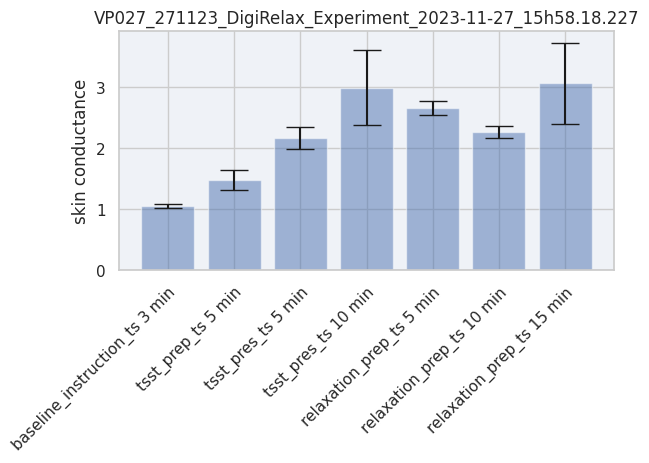

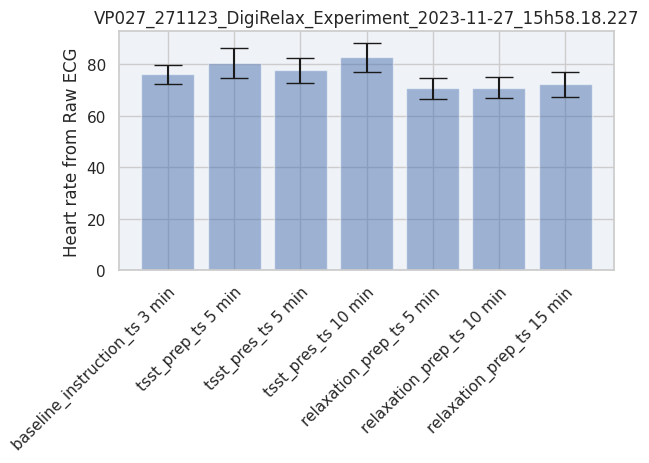

VP028_281123_DigiRelax_Experiment_2023-11-28_13h11.36.660


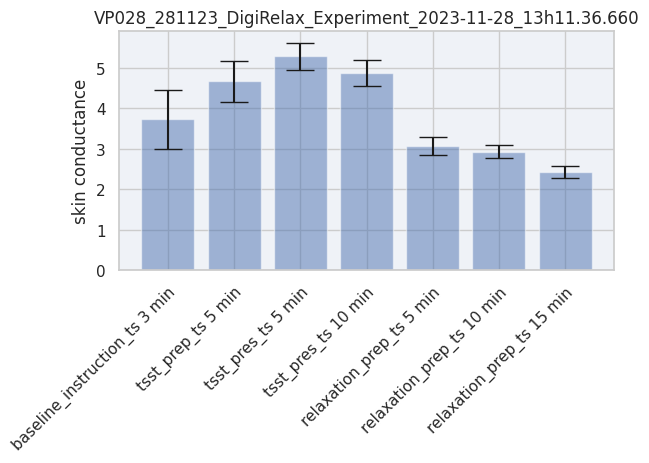

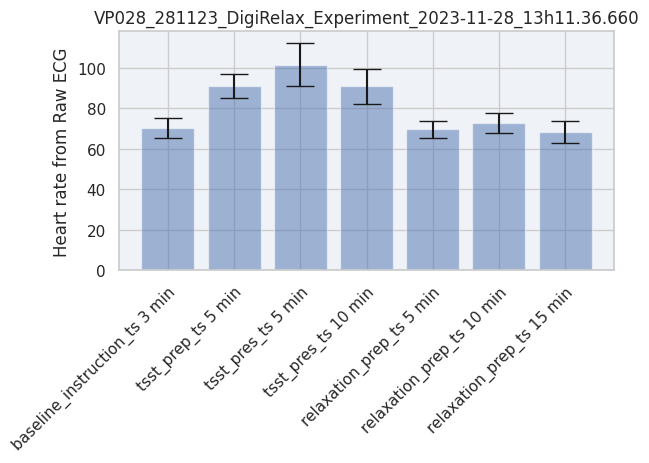

VP029_281123_DigiRelax_Experiment_2023-11-28_15h49.00.382


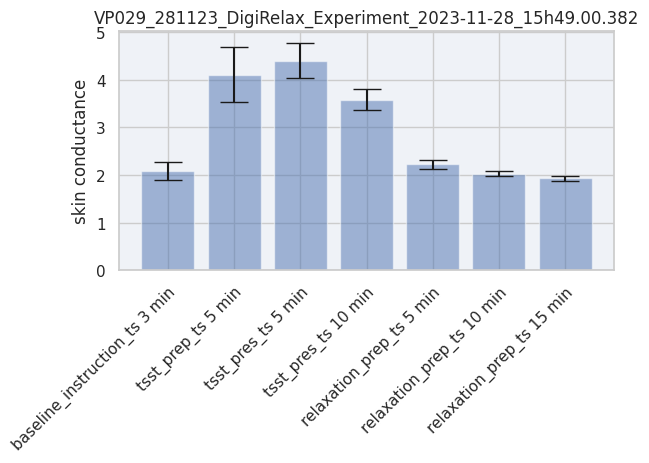

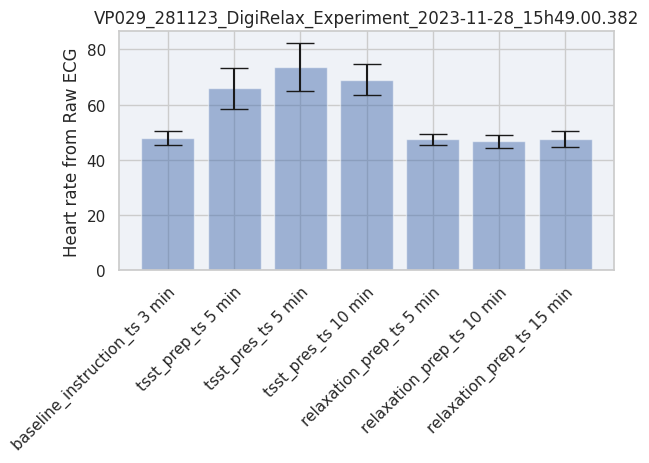

VP030_291123_DigiRelax_Experiment_2023-11-29_09h54.53.886


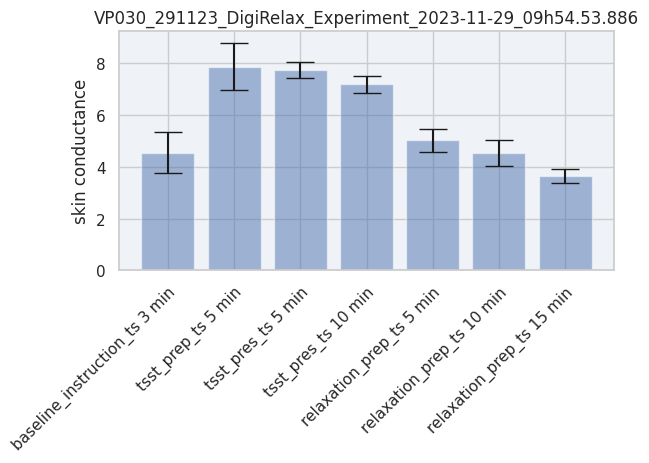

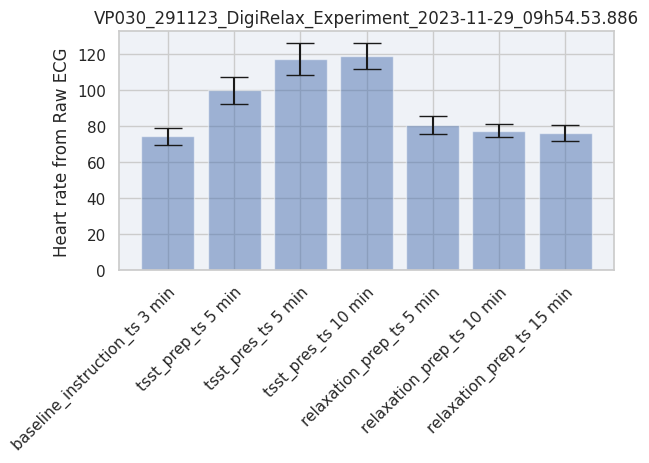

VP031_291123_DigiRelax_Experiment_2023-11-29_14h41.15.470


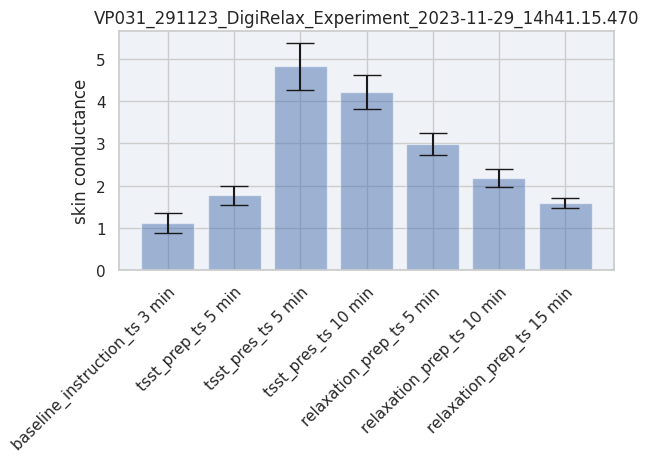

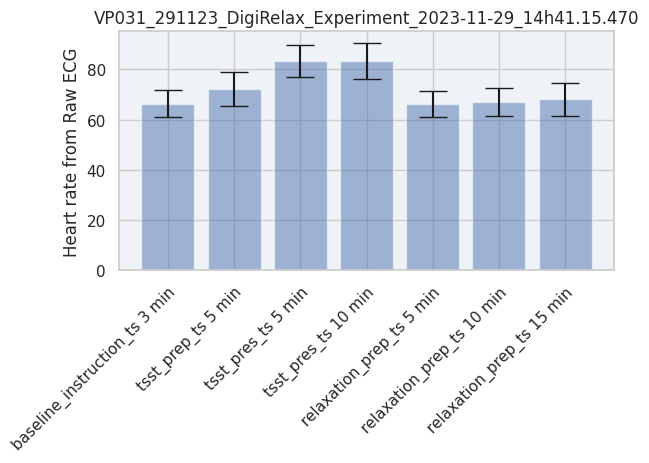

VP032_301123_DigiRelax_Experiment_2023-11-30_09h49.51.787


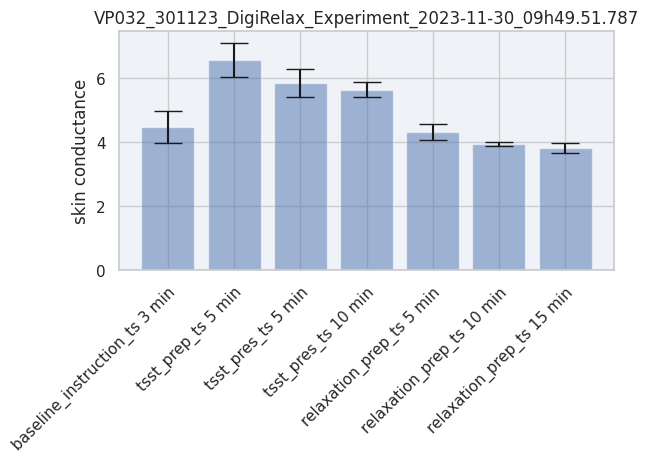

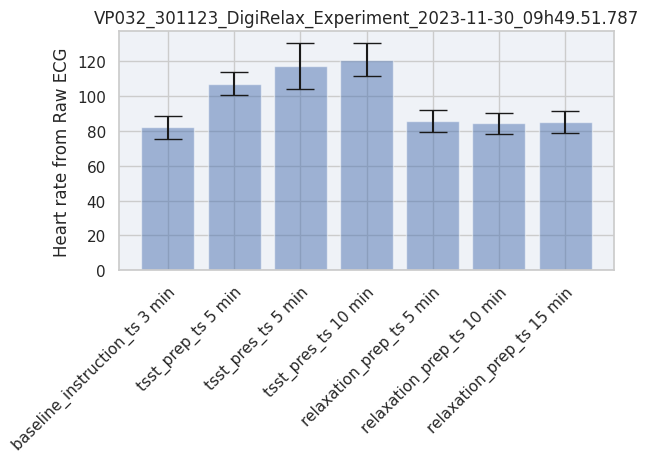

VP033_301123_DigiRelax_Experiment_2023-11-30_15h44.58.284


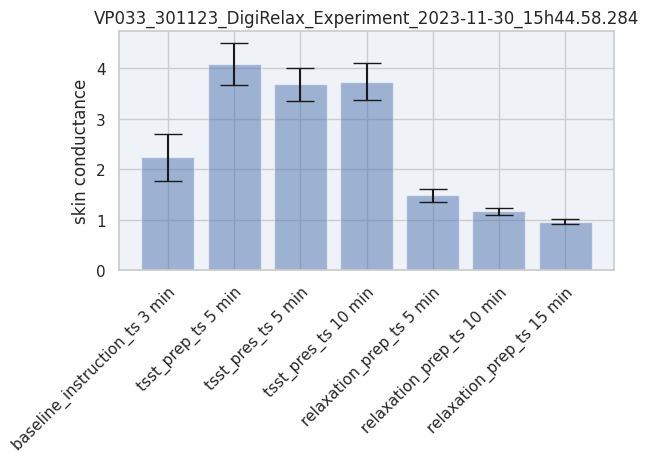

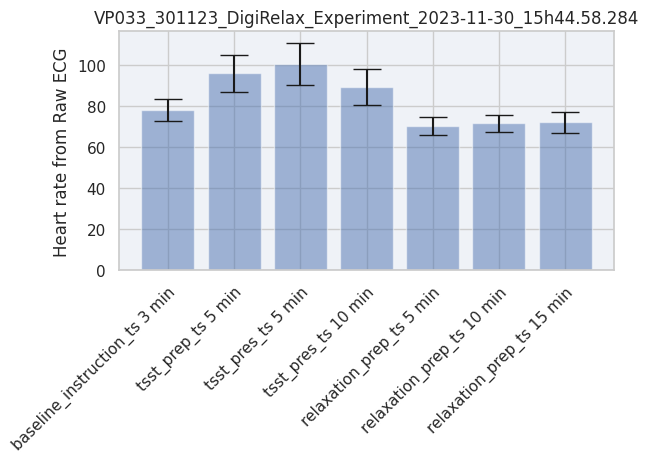

VP034_011223_DigiRelax_Experiment_2023-12-01_14h41.10.723


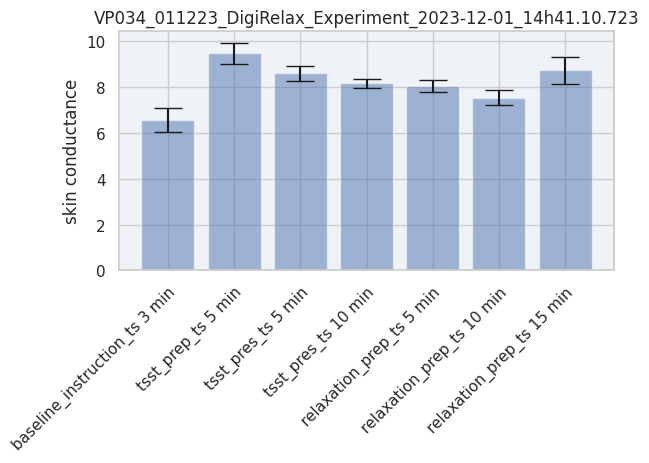

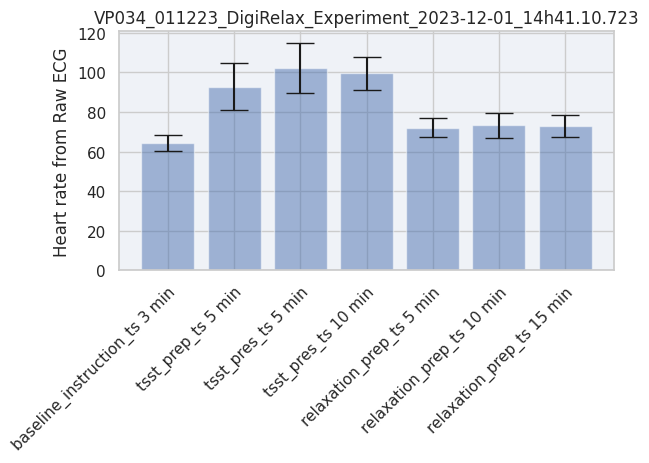

VP035_041123_DigiRelax_Experiment_2023-12-04_09h54.08.642


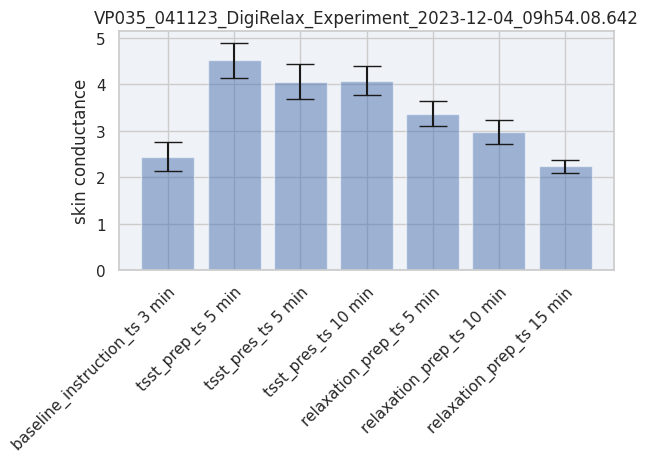

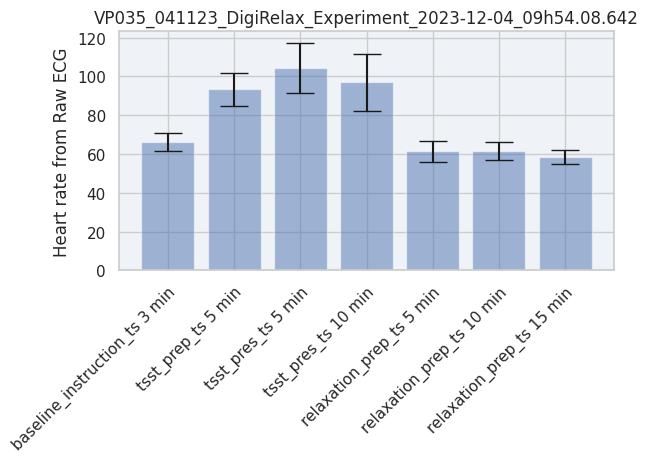

VP037_051223_DigiRelax_Experiment_2023-12-05_10h01.53.815


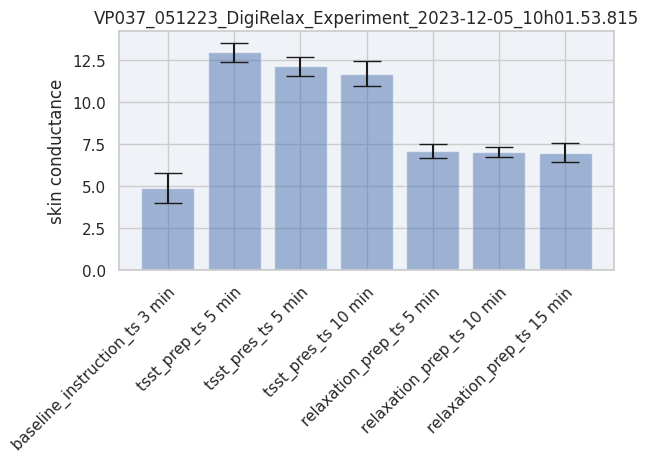

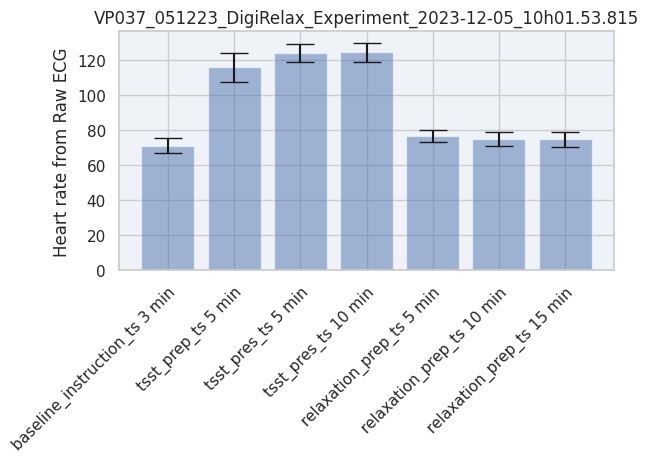

VP038_051223_DigiRelax_Experiment_2023-12-05_15h52.43.156


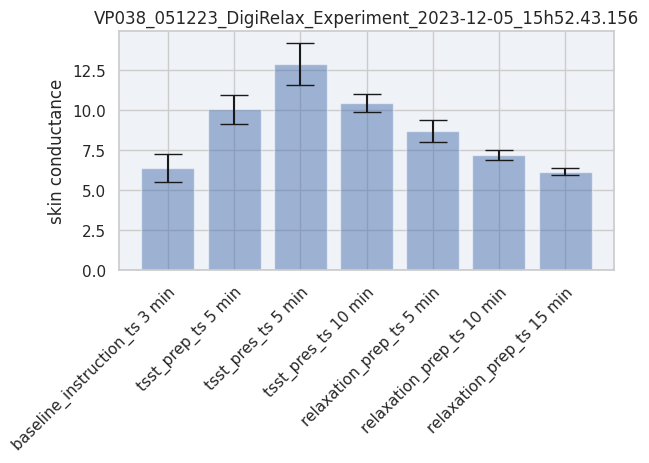

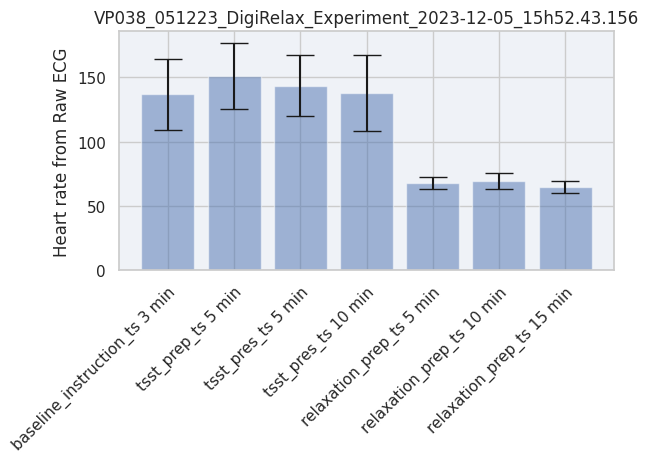

VP039_061223_DigiRelax_Experiment_2023-12-06_09h56.18.635


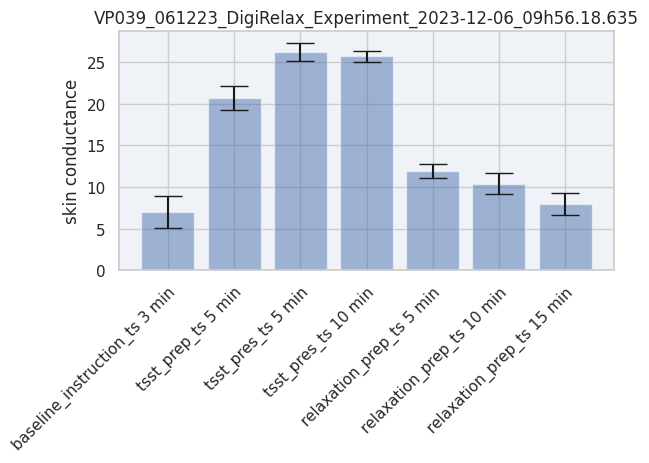

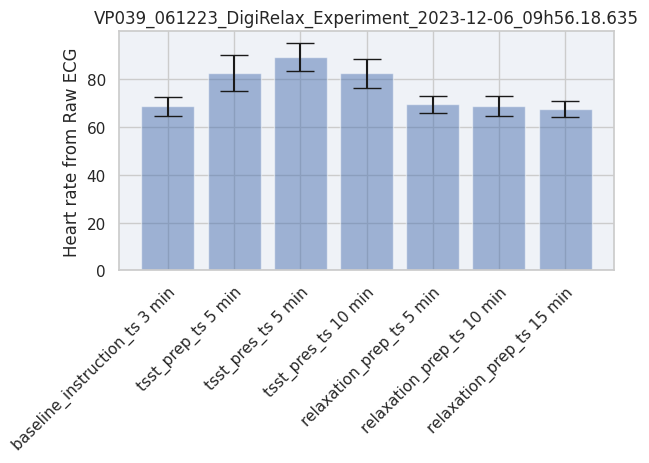

VP040_061223_DigiRelax_Experiment_2023-12-06_13h18.31.319


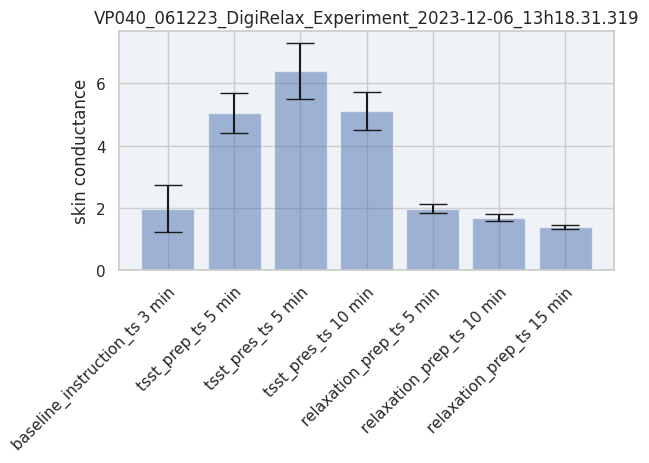

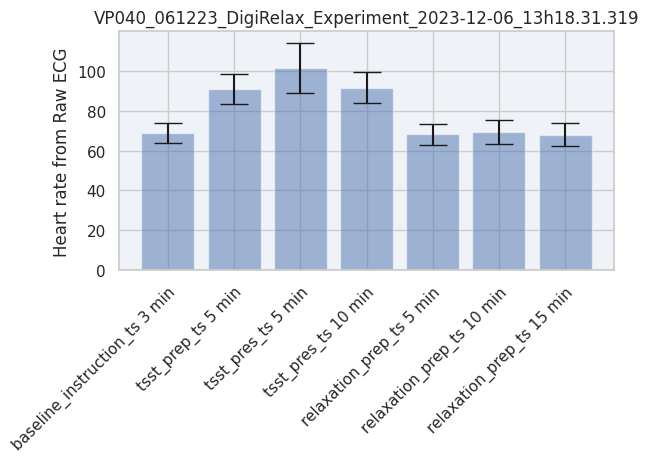

VP041_061223_DigiRelax_Experiment_2023-12-06_15h50.23.237


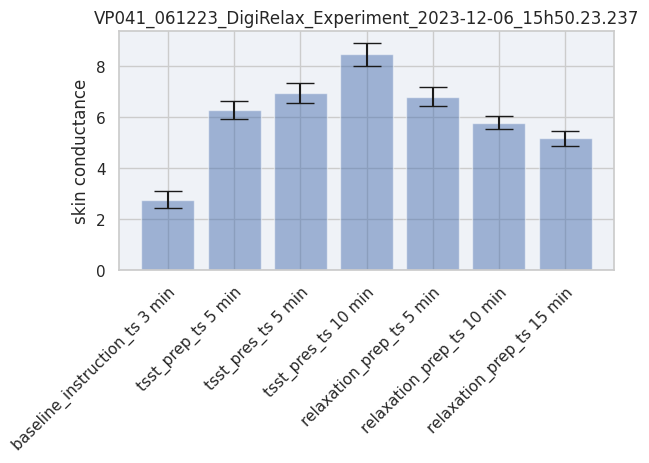

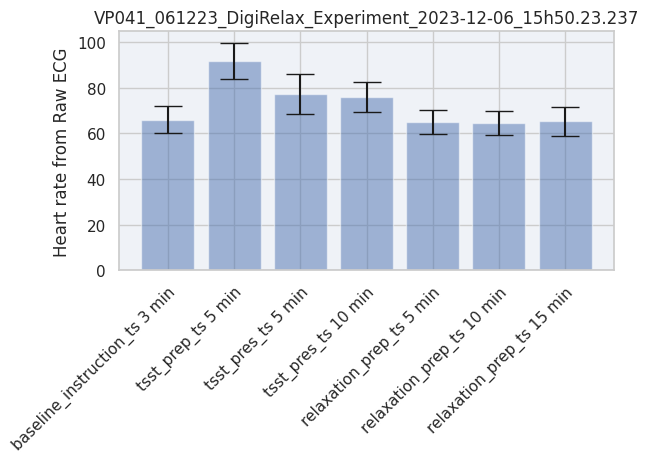

VP042_071223_DigiRelax_Experiment_2023-12-07_10h46.20.248


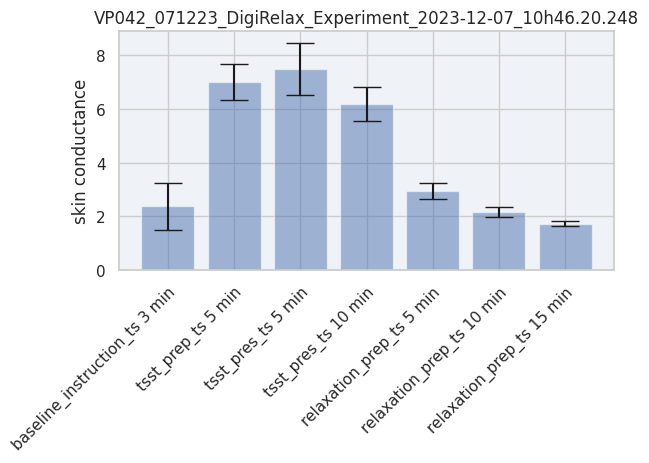

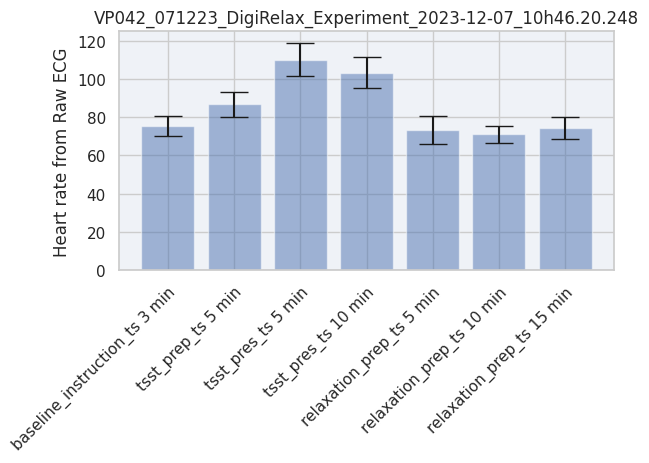

VP043_071223_DigiRelax_Experiment_2023-12-07_13h24.11.749


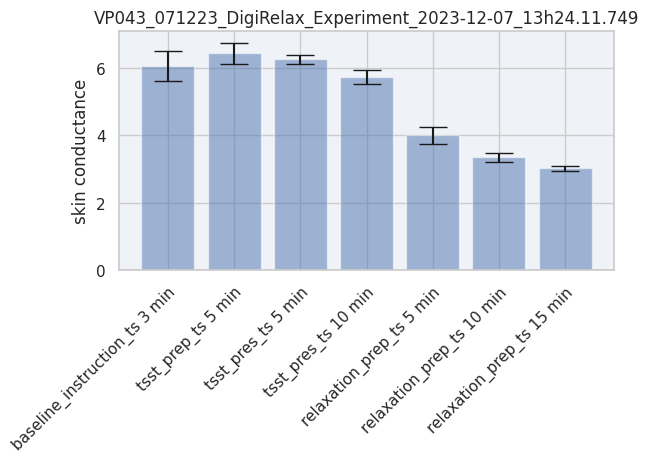

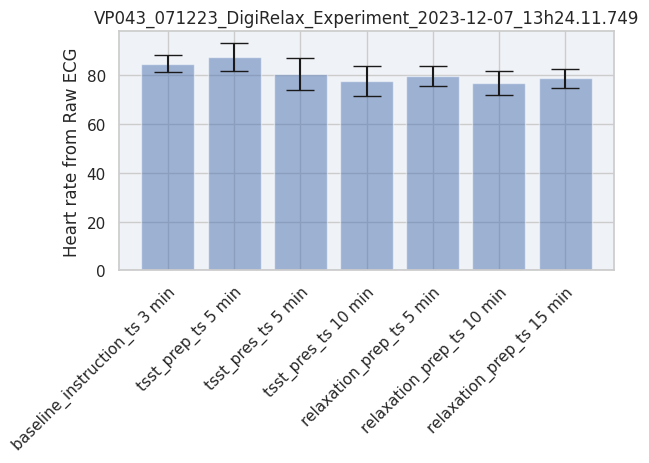

VP044_071223_DigiRelax_Experiment_2023-12-07_15h47.55.663


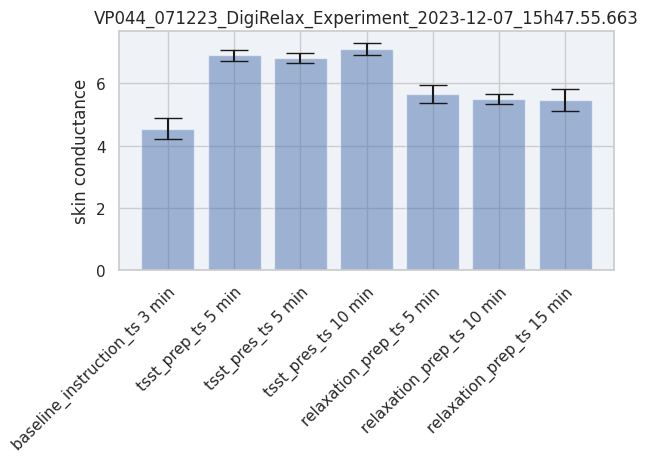

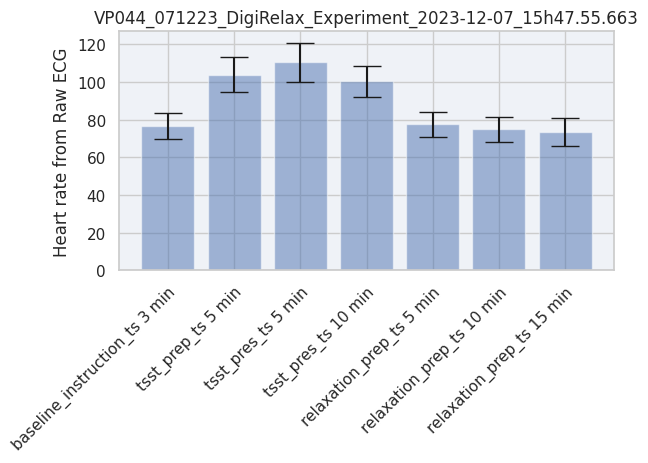

VP045_081223_DigiRelax_Experiment_2023-12-08_09h50.13.039


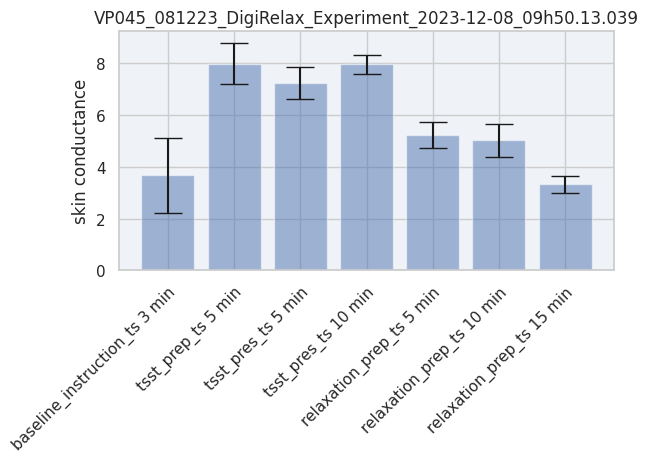

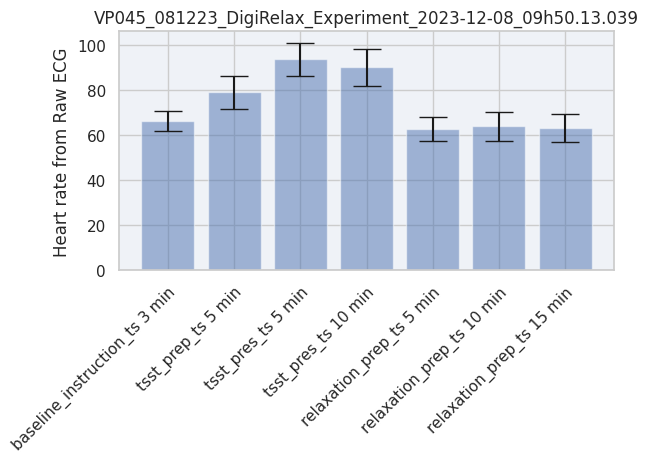

Vp046_081223_DigiRelax_Experiment_2023-12-08_14h49.59.665


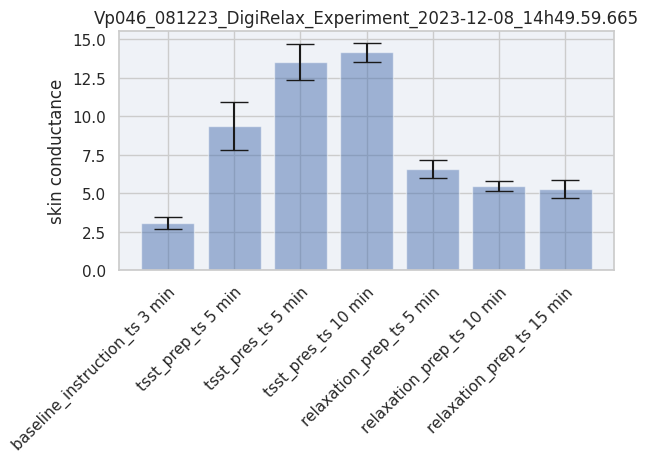

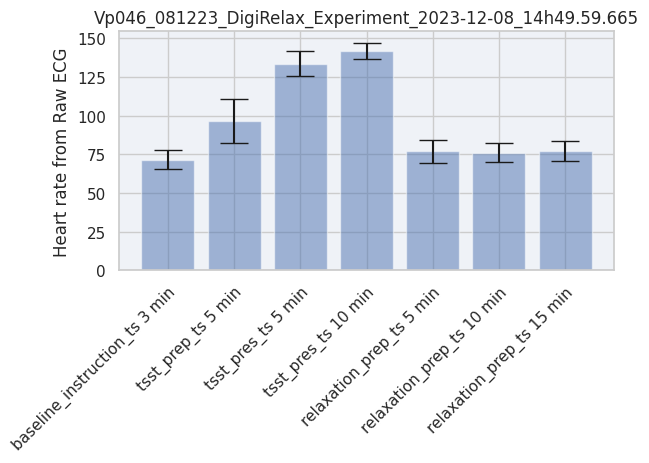

VP047_111223_DigiRelax_Experiment_2023-12-11_14h40.20.997


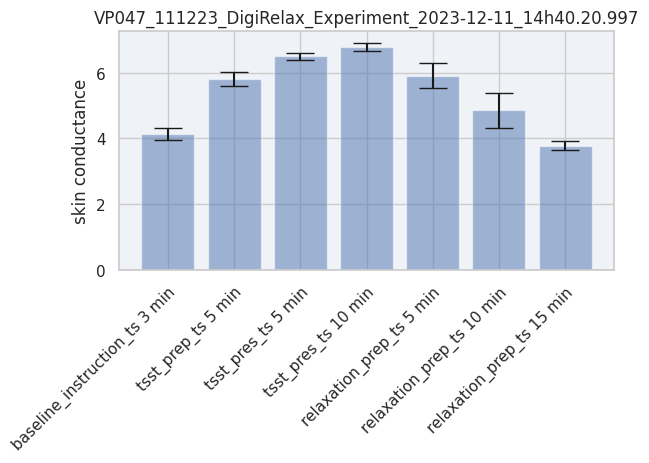

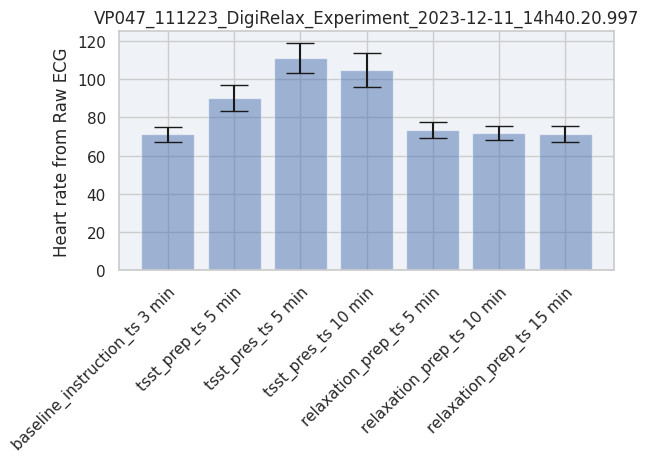

VP048_121223_DigiRelax_Experiment_2023-12-12_09h46.06.539


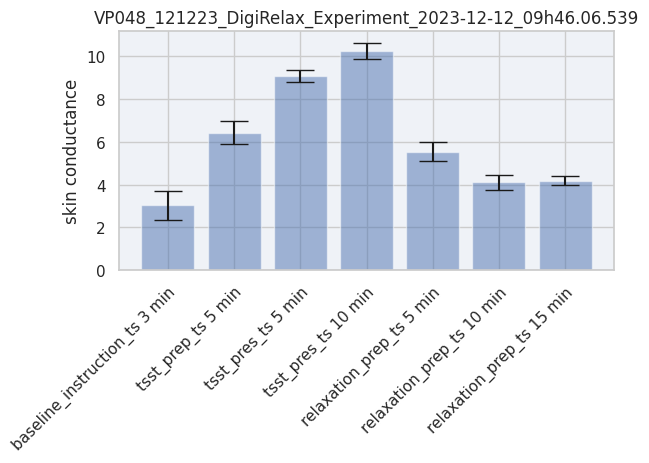

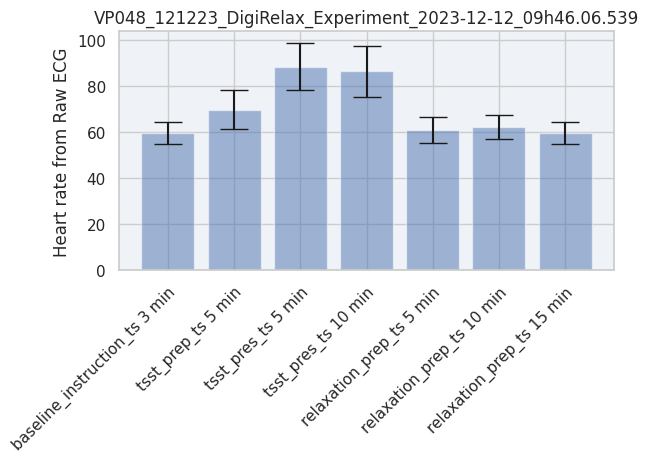

VP049_121223_DigiRelax_Experiment_2023-12-12_13h41.48.891


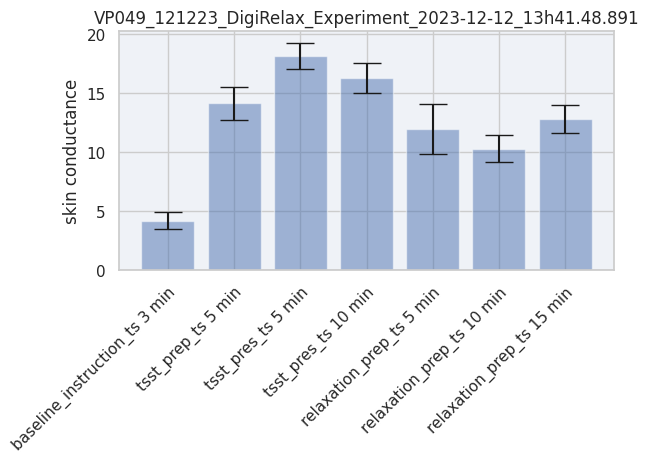

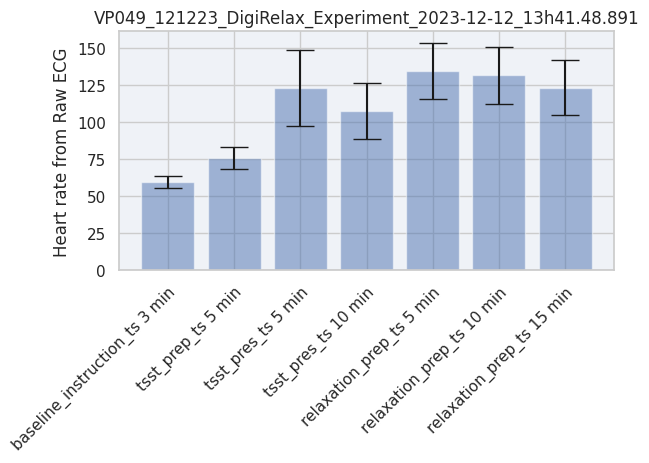

VP050_131223_DigiRelax_Experiment_2023-12-13_09h49.36.277


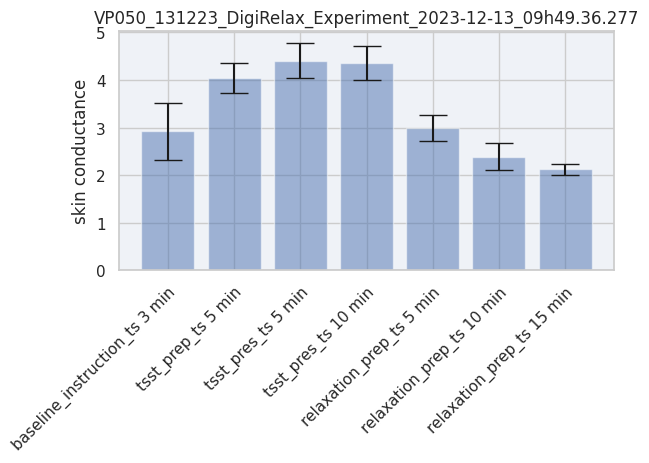

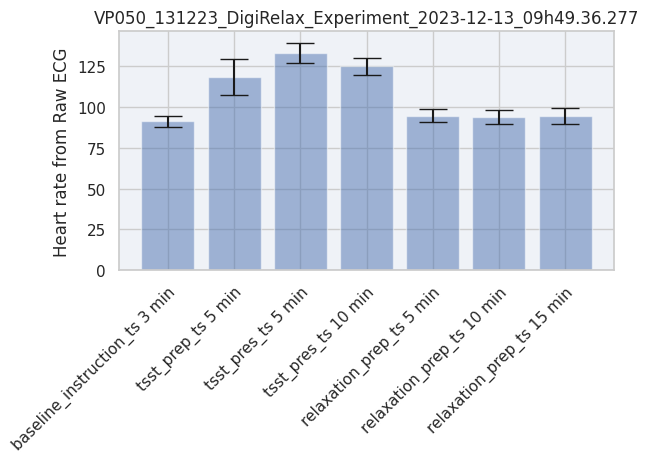

VP051_131223_DigiRelax_Experiment_2023-12-13_13h12.46.570


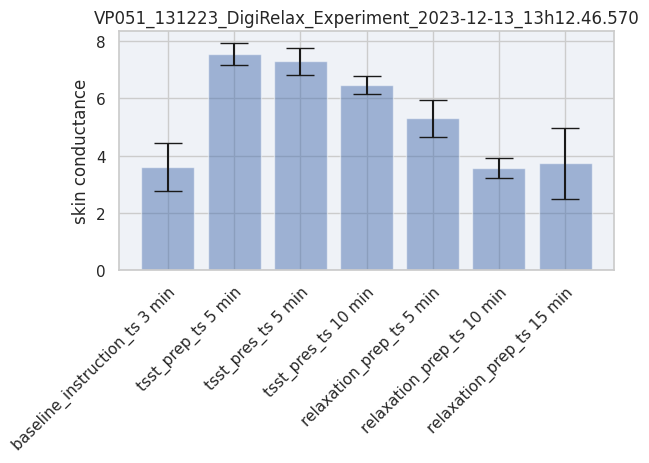

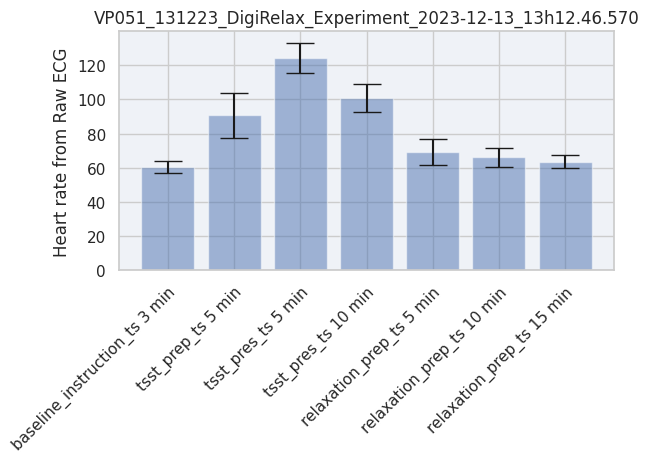

VP052_131223_DigiRelax_Experiment_2023-12-13_15h40.02.531


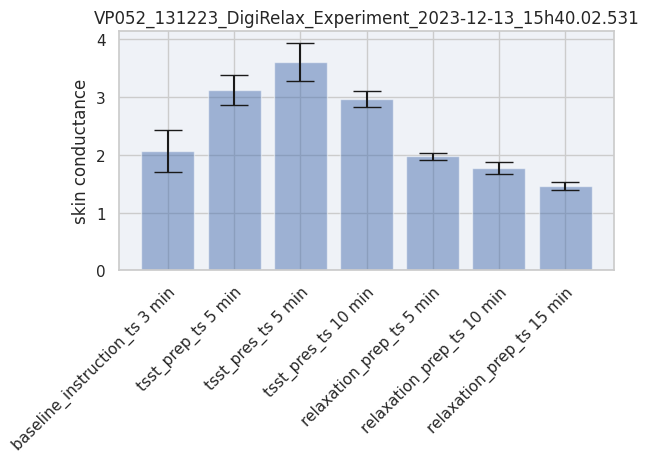

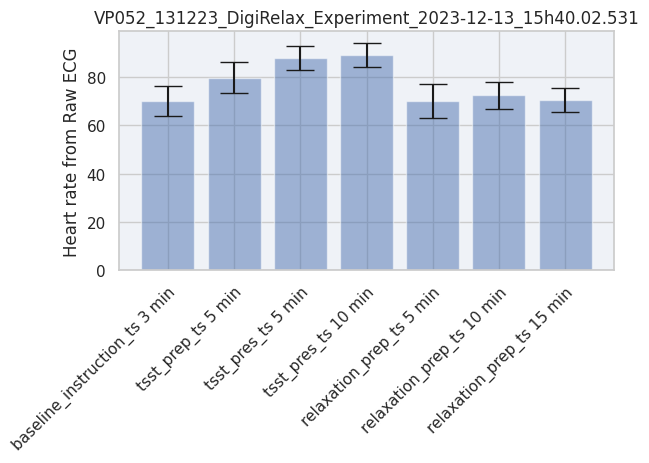

VP053_141223_DigiRelax_Experiment_2023-12-14_09h43.01.217


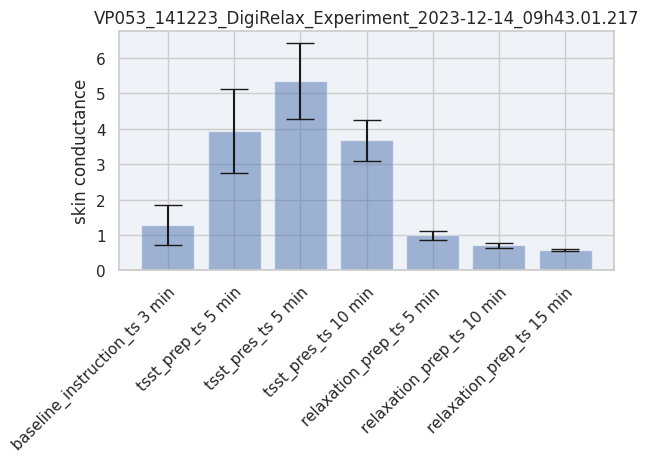

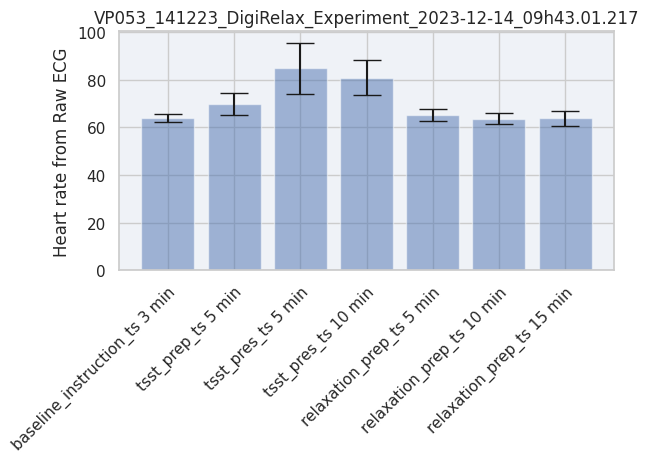

VP054_141223_DigiRelax_Experiment_2023-12-14_13h16.33.883


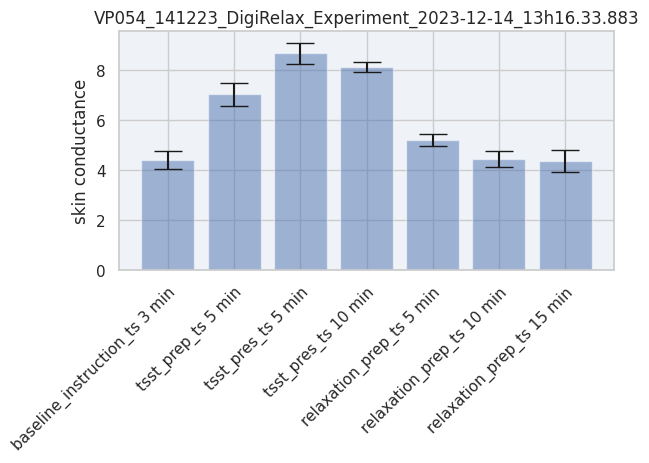

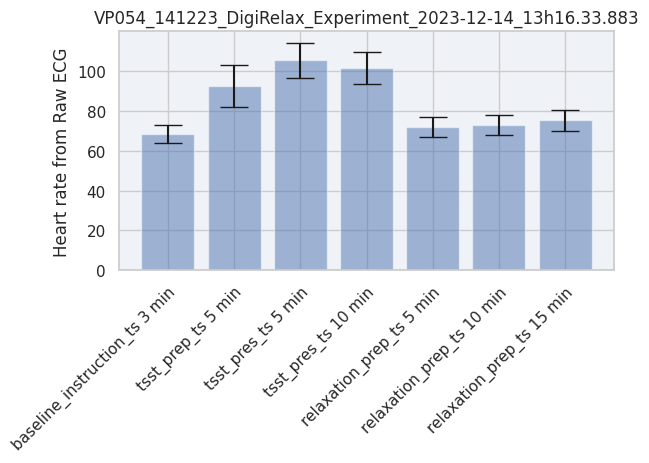

VP055_141223_DigiRelax_Experiment_2023-12-14_15h45.35.483


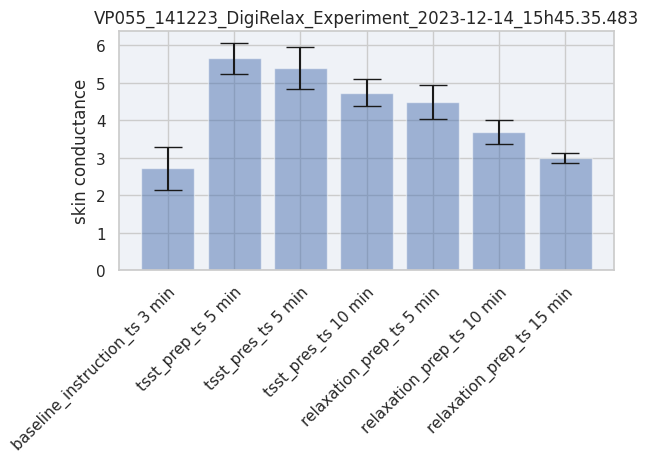

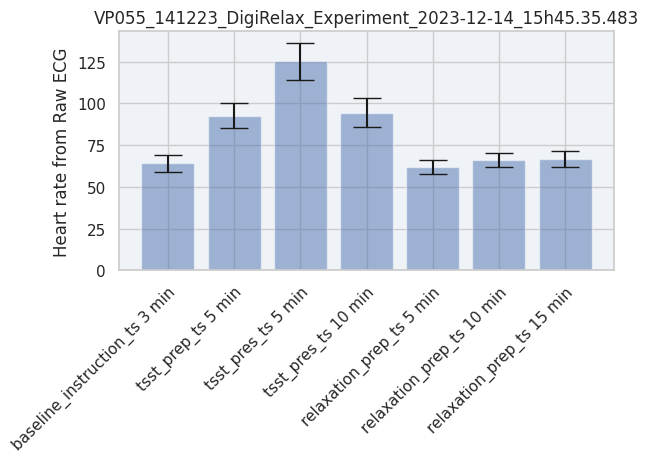

VP056_151223_DigiRelax_Experiment_2023-12-15_09h45.05.317


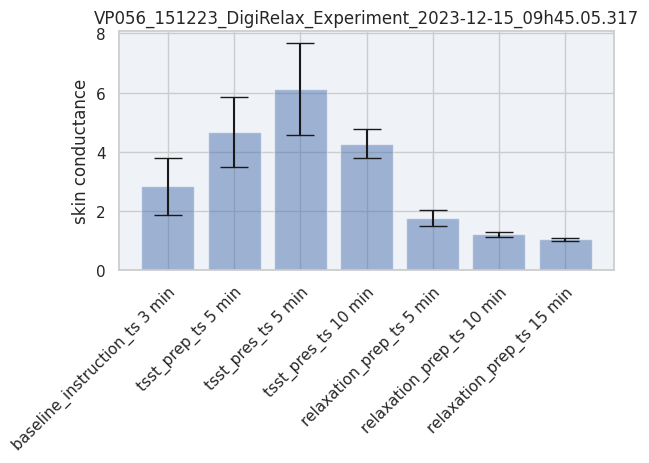

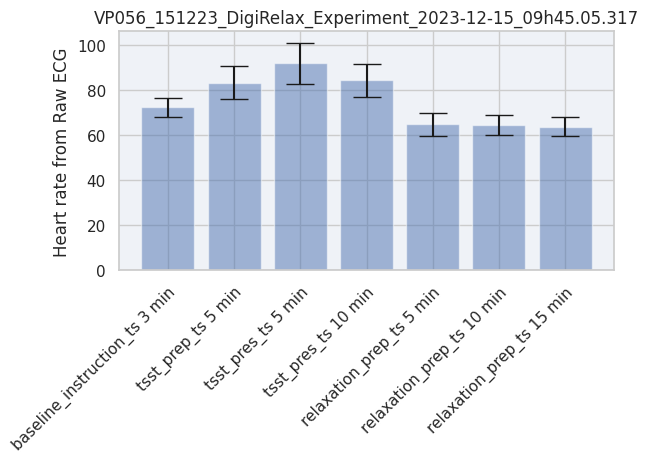

VP057_151223_DigiRelax_Experiment_2023-12-15_15h00.46.722


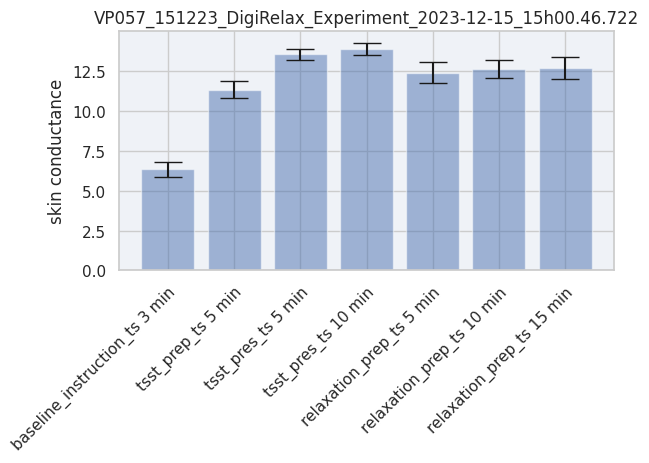

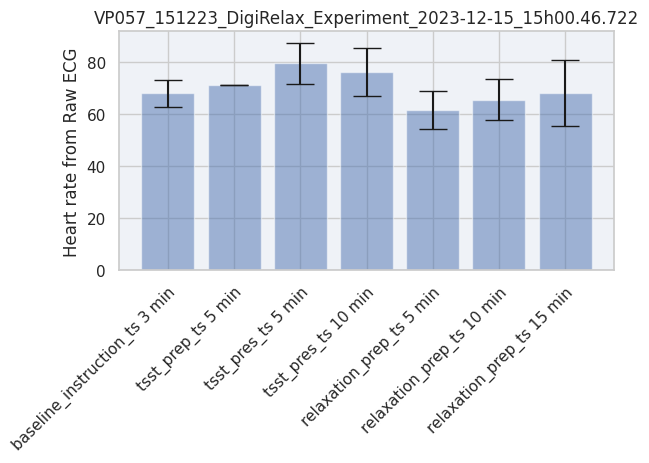

VP059_181223_DigiRelax_Experiment_2023-12-18_14h46.34.198


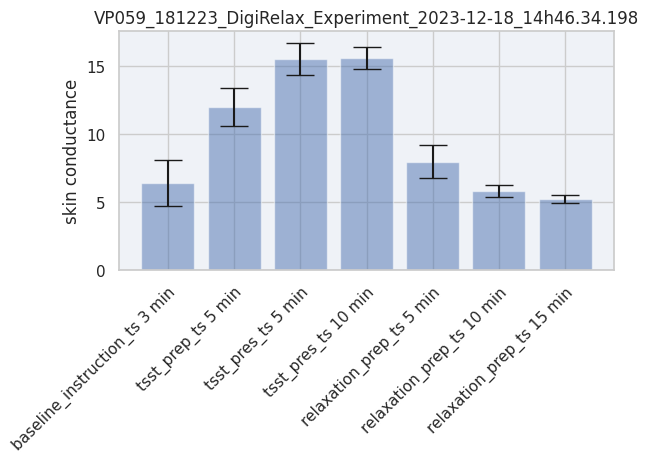

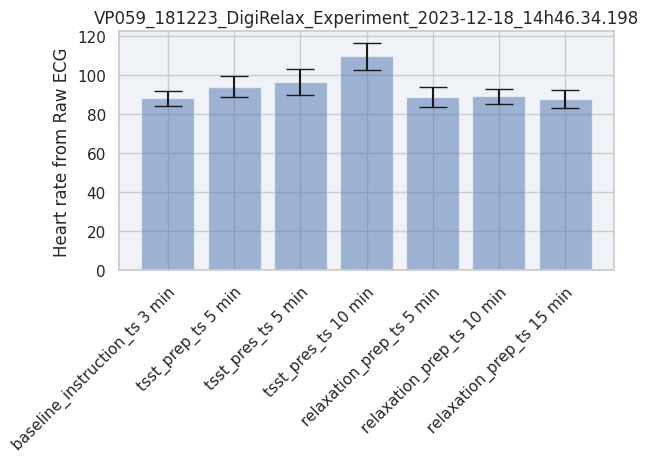

VP060_191223_DigiRelax_Experiment_2023-12-19_09h48.26.679


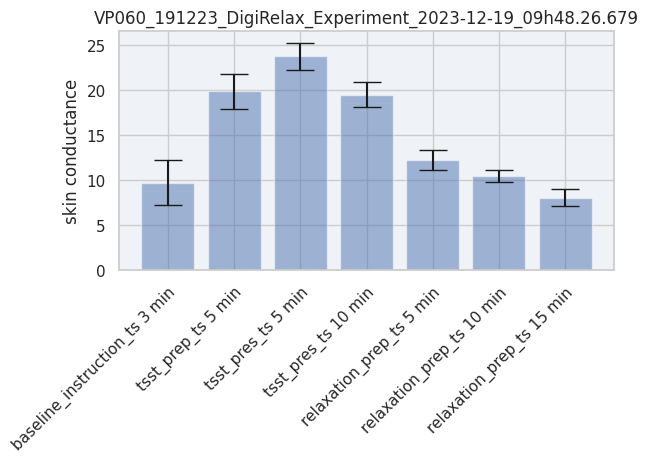

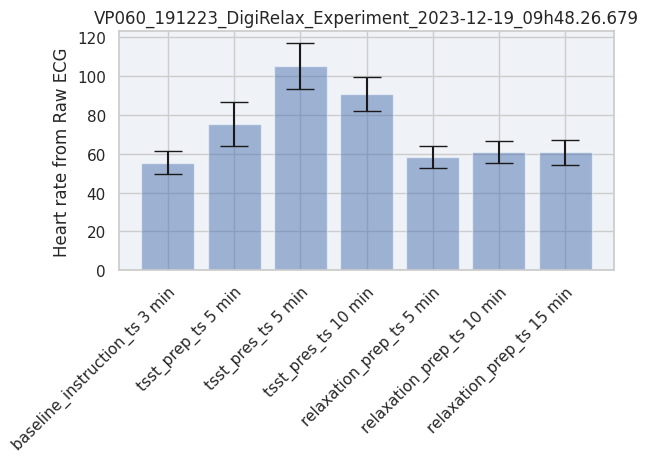

VP063_040124_DigiRelax_Experiment_2024-01-04_14h59.12.423


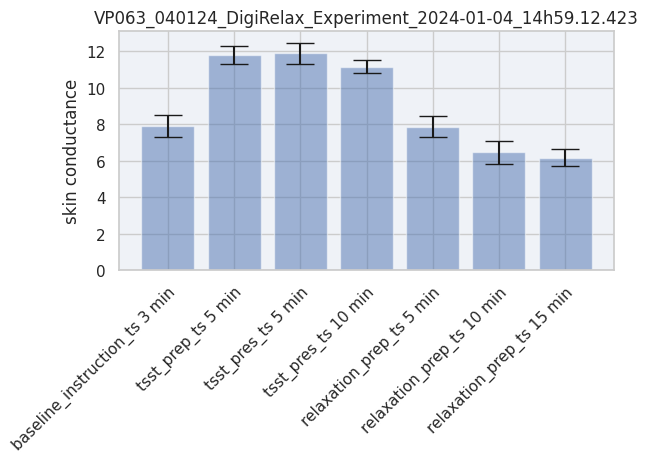

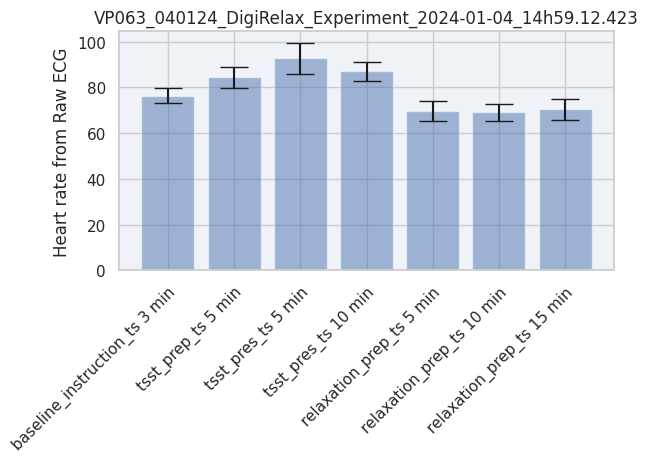

VP064_050124_DigiRelax_Experiment_2024-01-05_09h44.11.070


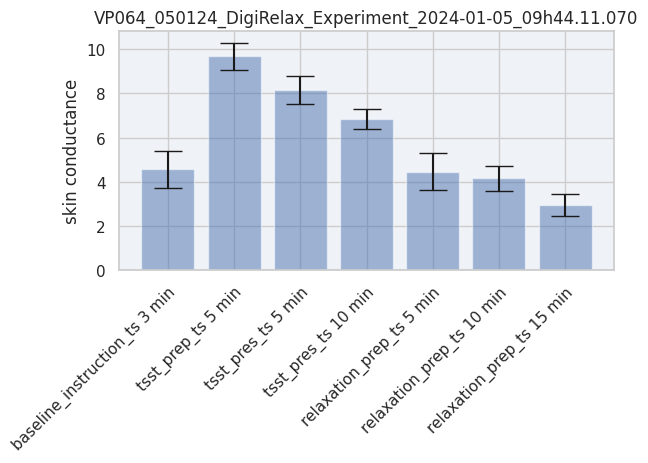

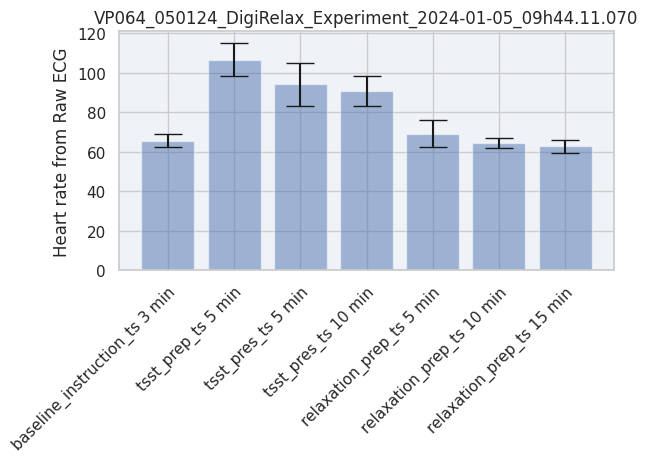

VP065_050124_DigiRelax_Experiment_2024-01-05_14h41.28.548


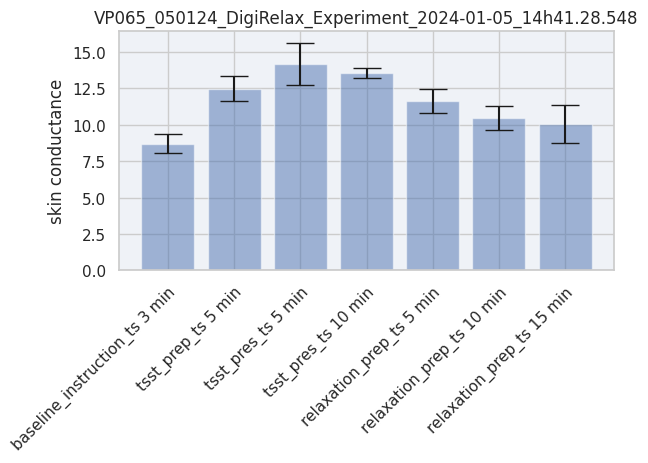

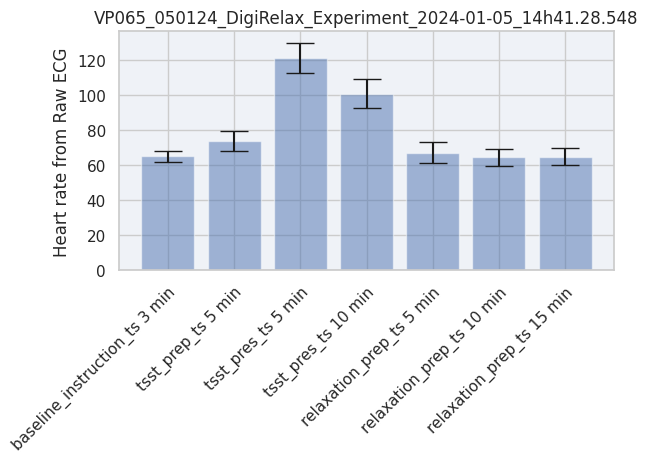

VP066_080124_DigiRelax_Experiment_2024-01-08_13h36.32.476


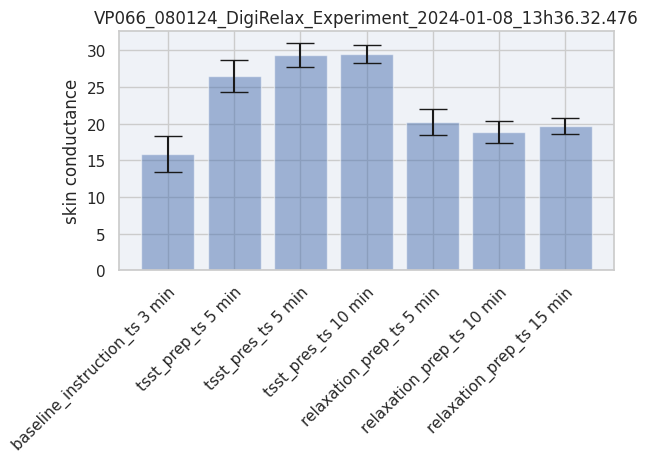

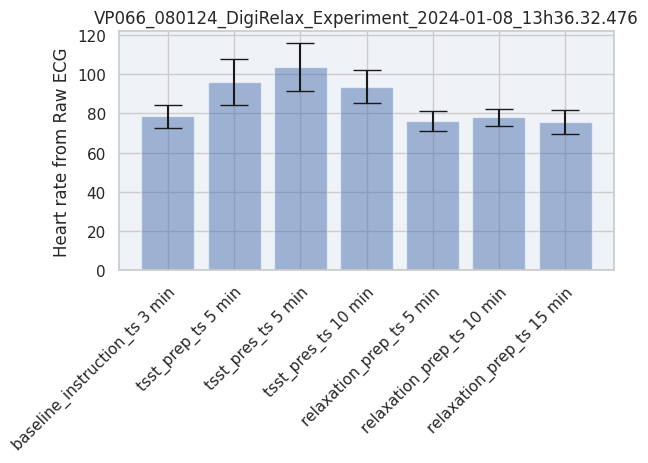

VP067_100124_DigiRelax_Experiment_2024-01-10_09h51.01.071


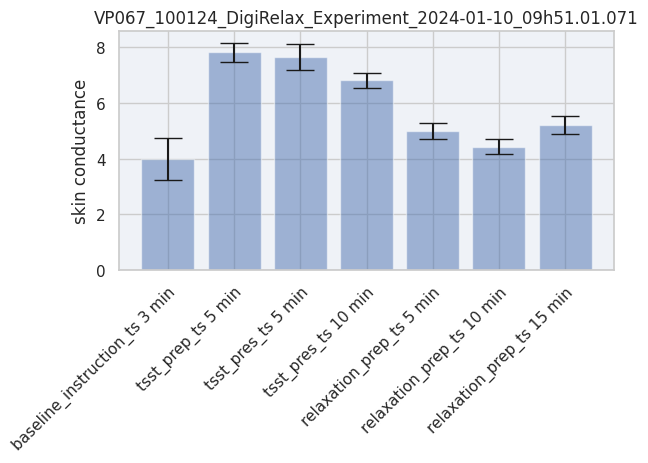

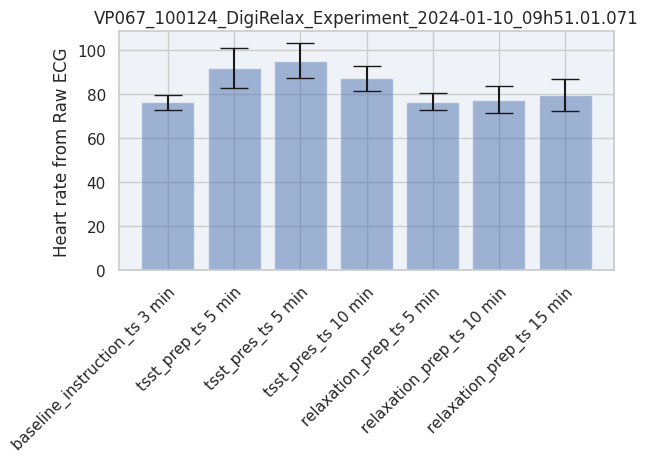

VP068_100124_DigiRelax_Experiment_2024-01-10_14h41.55.244


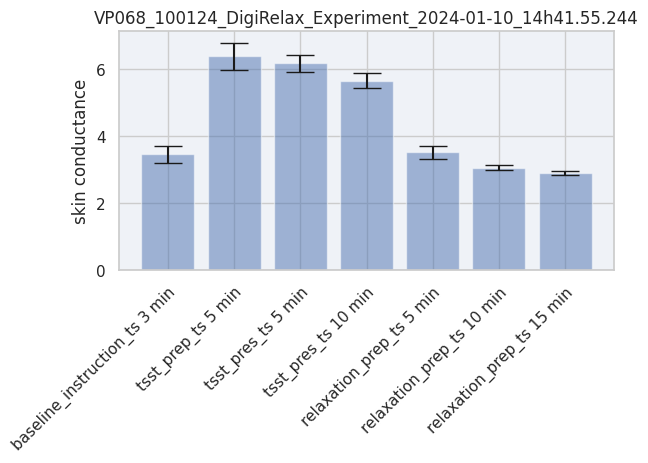

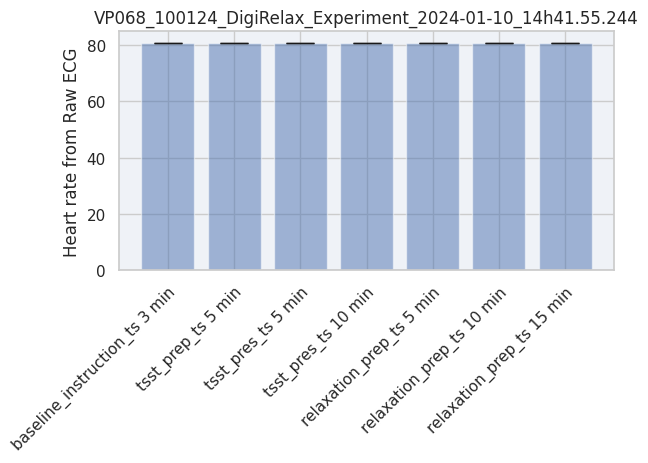

VP069_110124_DigiRelax_Experiment_2024-01-11_09h51.14.639


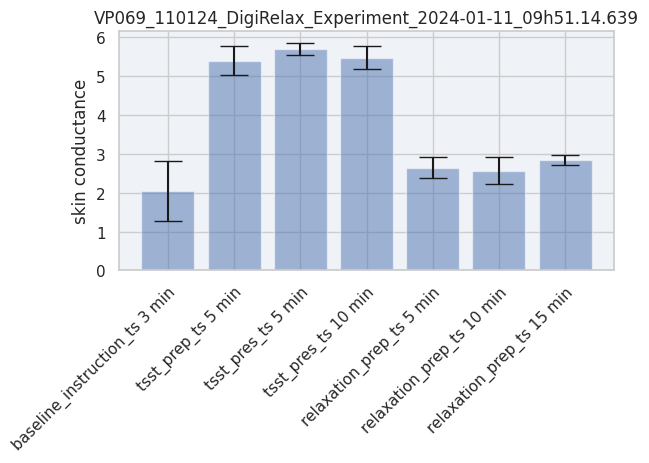

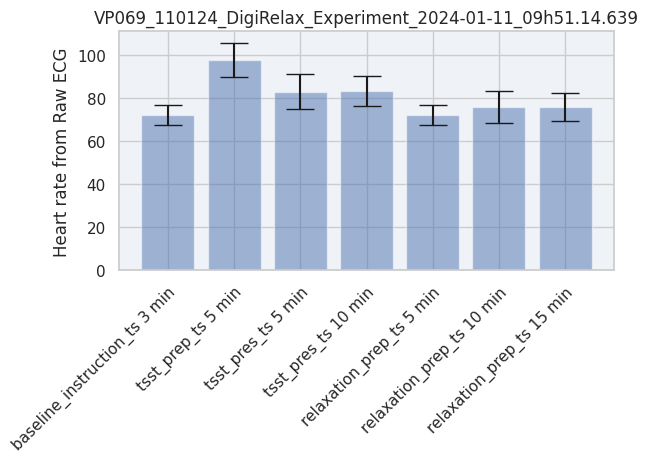

VP070_110124_DigiRelax_Experiment_2024-01-11_14h48.50.074


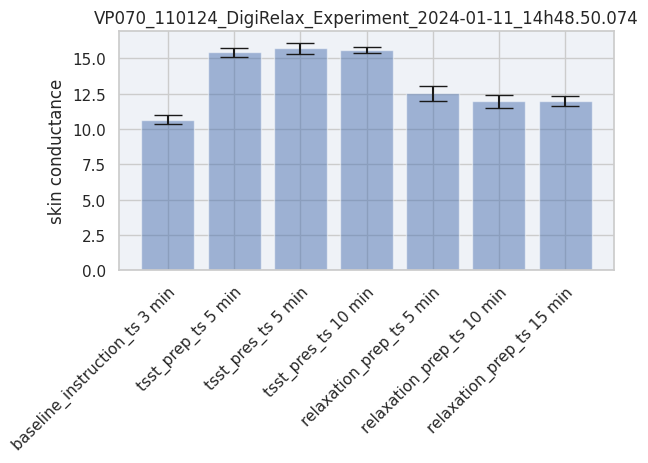

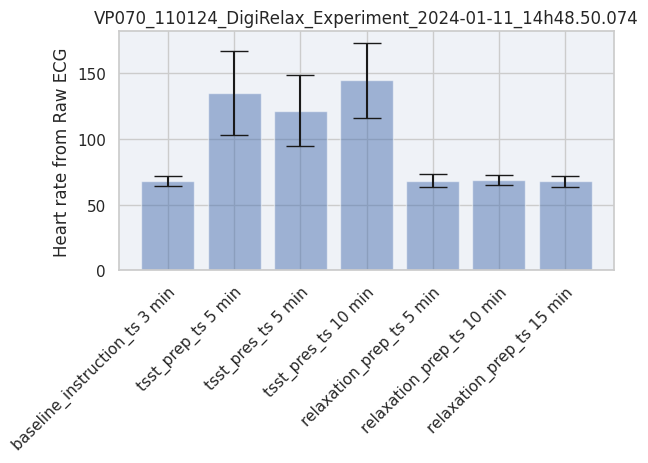

VP071_120124_DigiRelax_Experiment_2024-01-12_09h48.13.466


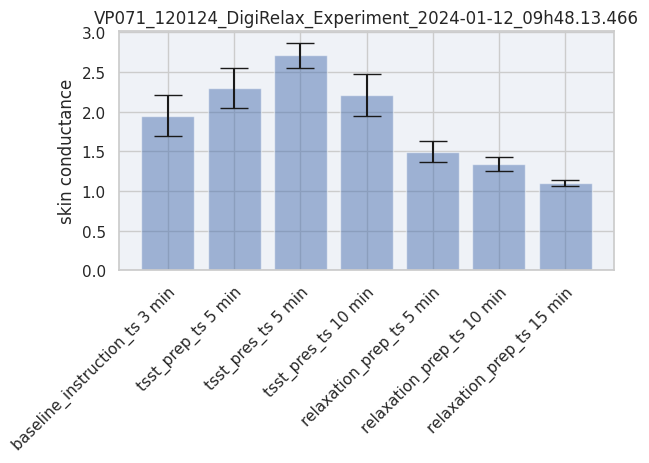

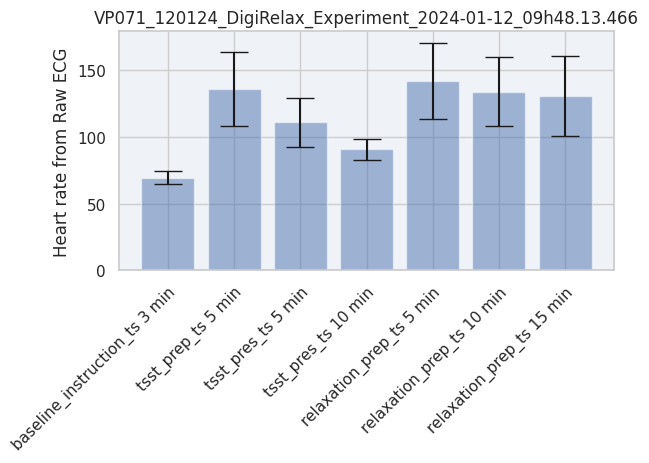

VP072_120124_DigiRelax_Experiment_2024-01-12_14h45.23.547


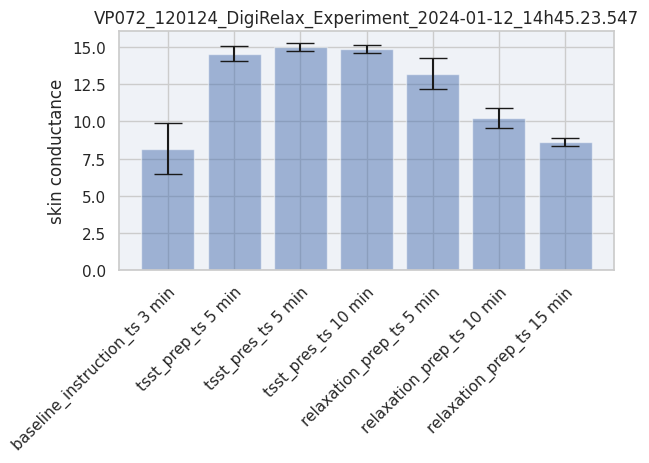

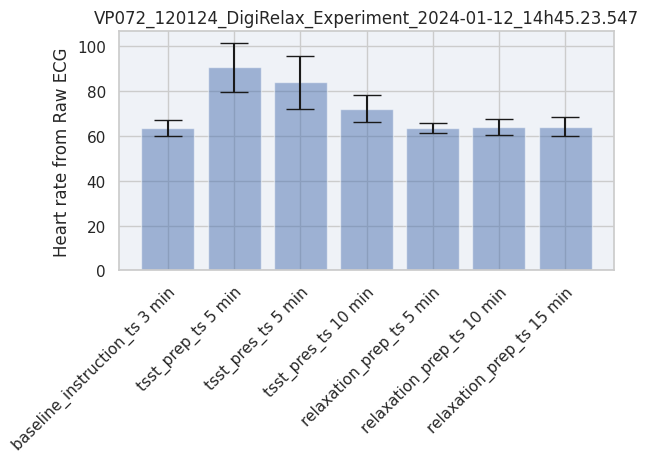

VP073_150124_DigiRelax_Experiment_2024-01-15_10h17.11.190


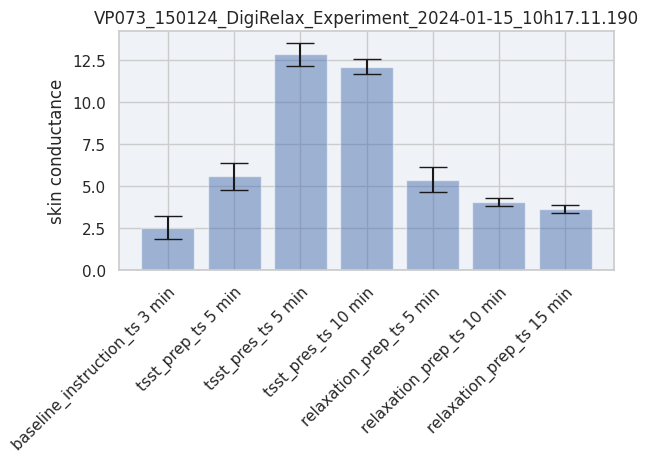

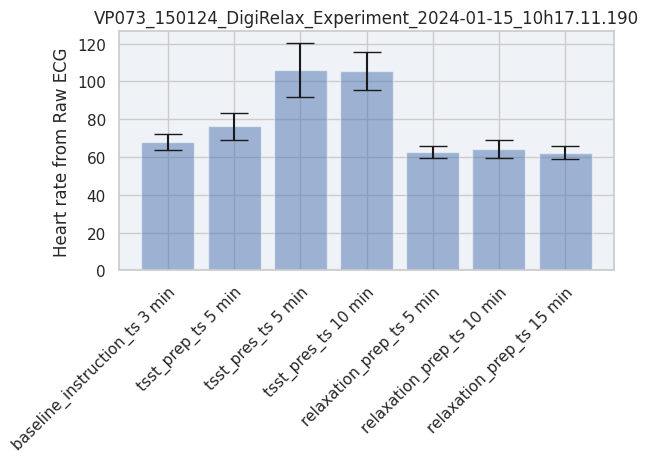

VP074_170124_DigiRelax_Experiment_2024-01-17_09h52.17.376


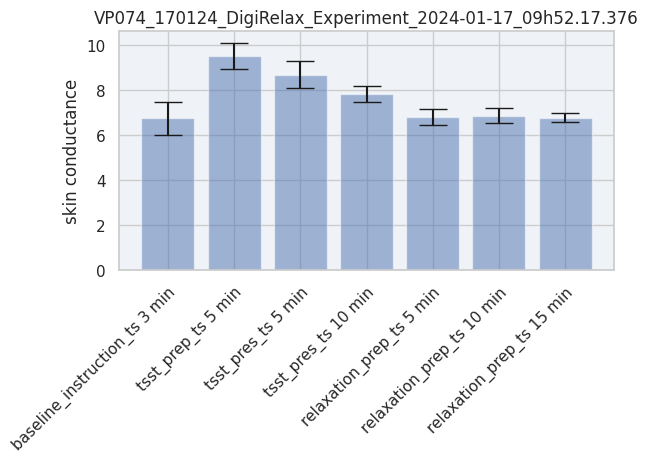

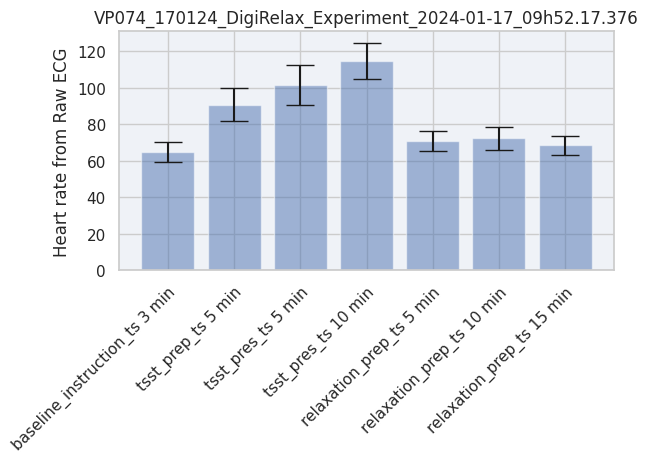

VP075_180124_DigiRelax_Experiment_2024-01-18_09h54.07.734


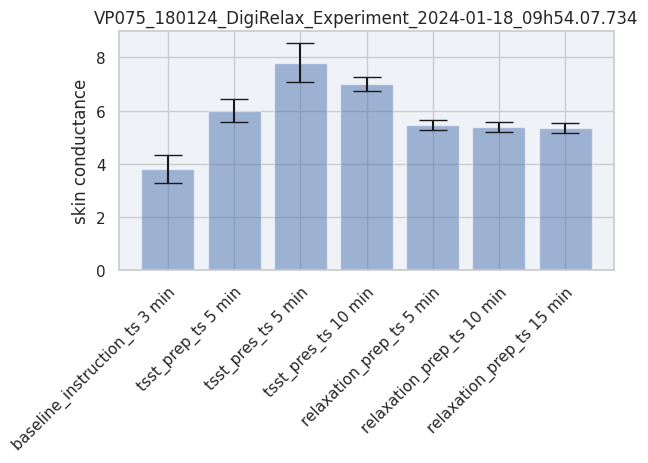

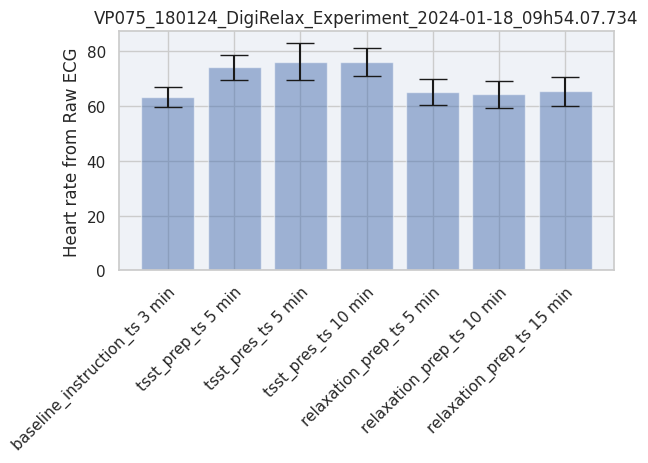

VP076_220124_DigiRelax_Experiment_2024-01-22_14h29.54.037


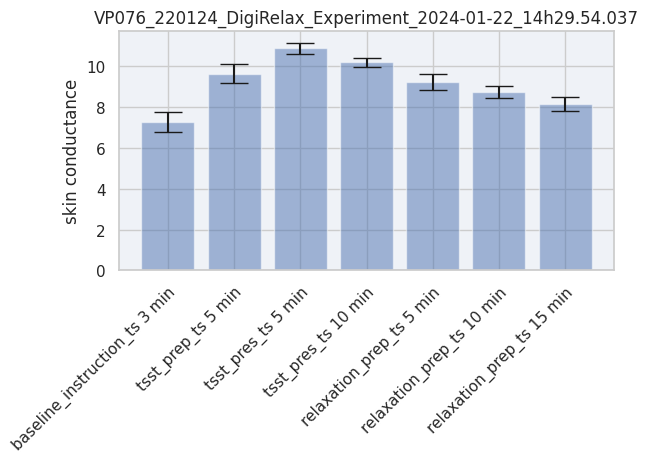

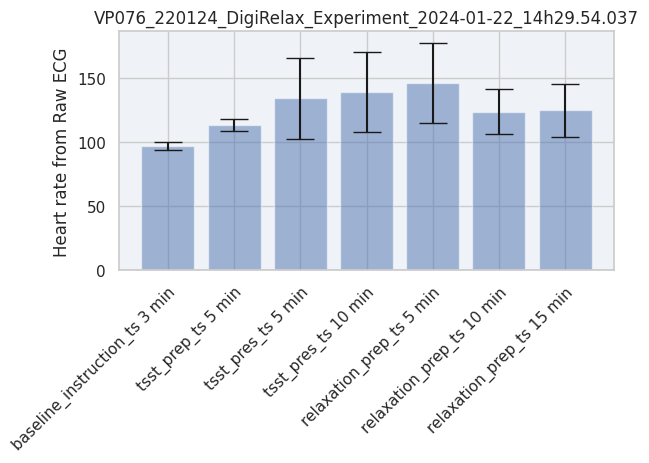

VP077_240124_DigiRelax_Experiment_2024-01-24_09h41.27.985


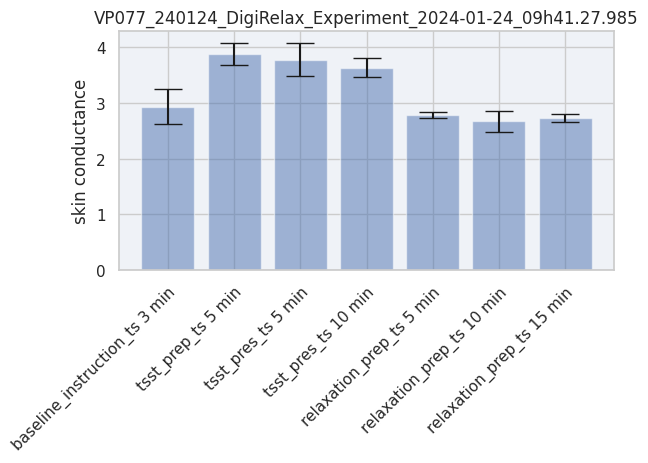

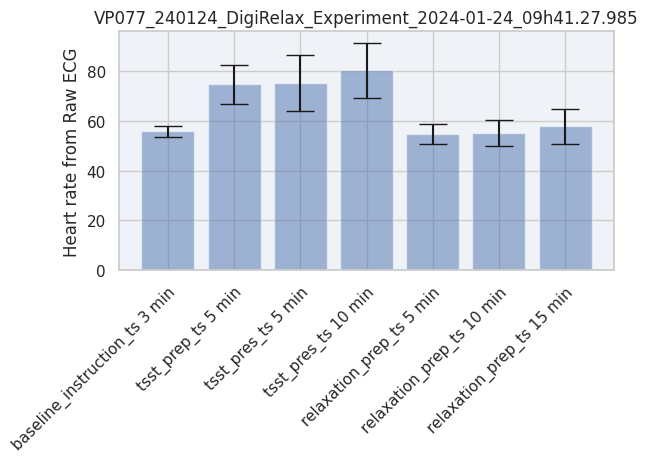

VP078_240124_DigiRelax_Experiment_2024-01-24_14h45.04.447


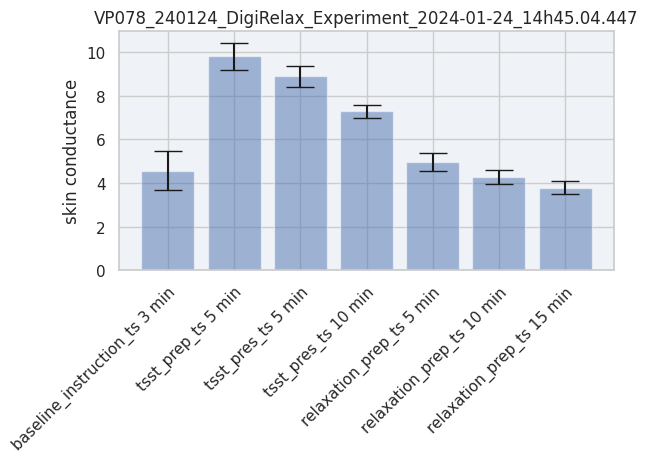

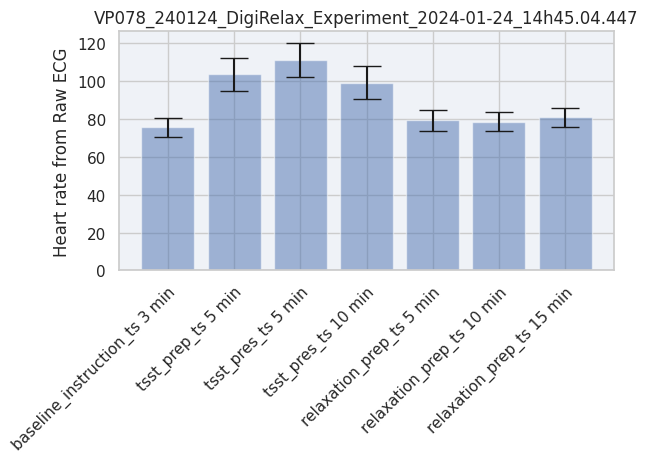

VP079_250124_DigiRelax_Experiment_2024-01-25_11h20.02.642


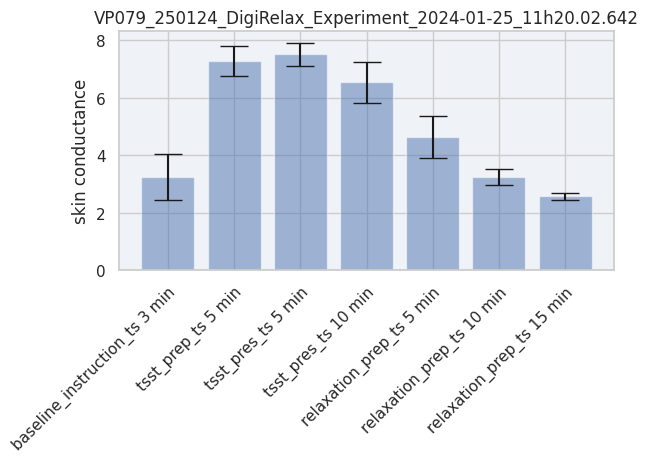

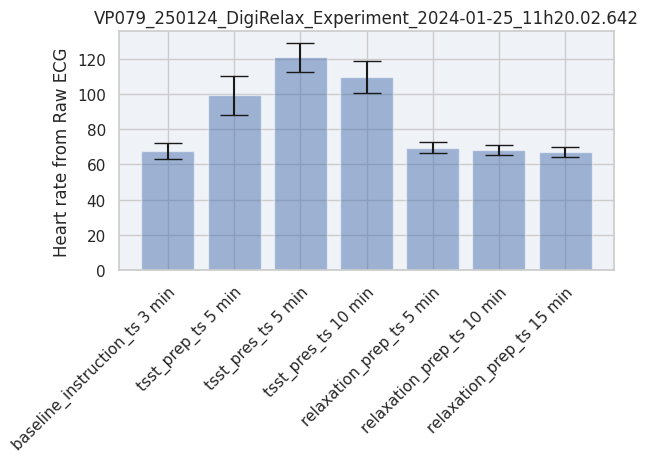

VP080_250124_DigiRelax_Experiment_2024-01-25_14h58.20.993


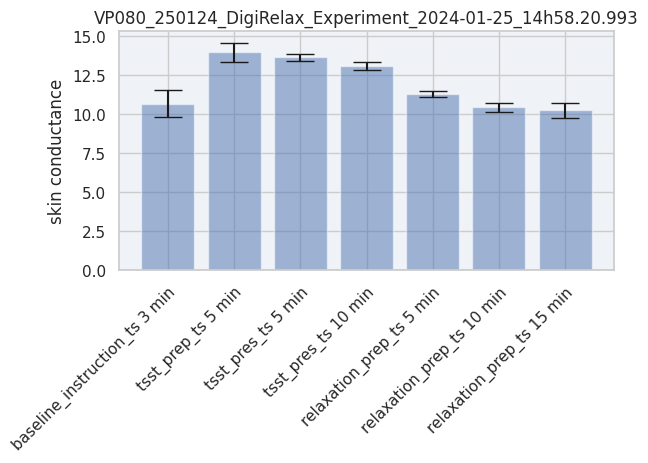

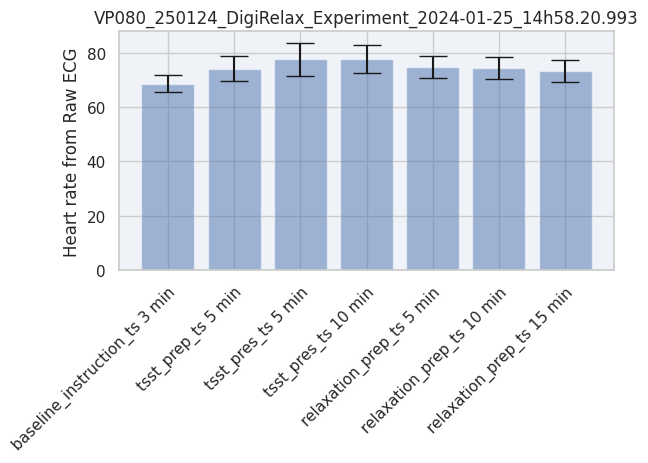

VP081_260124_DigiRelax_Experiment_2024-01-26_10h25.25.740


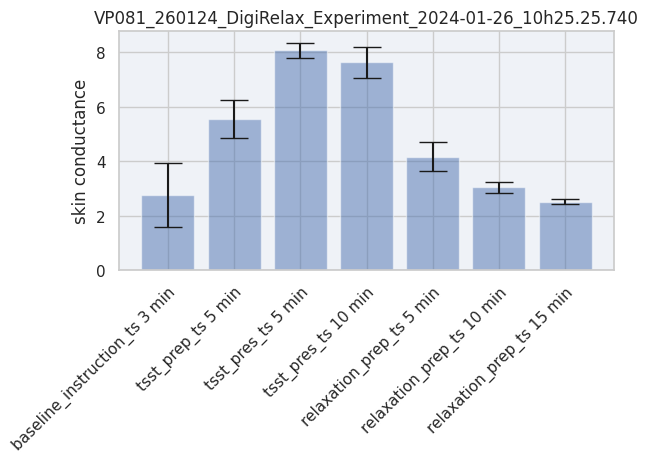

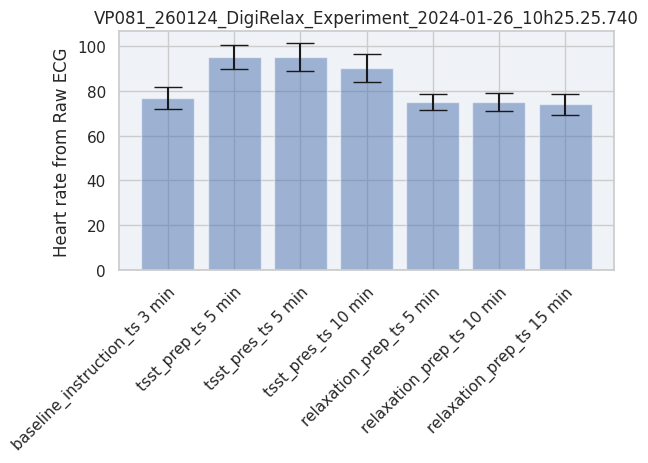

VP083_310124_DigiRelax_Experiment_2024-01-31_09h50.52.785


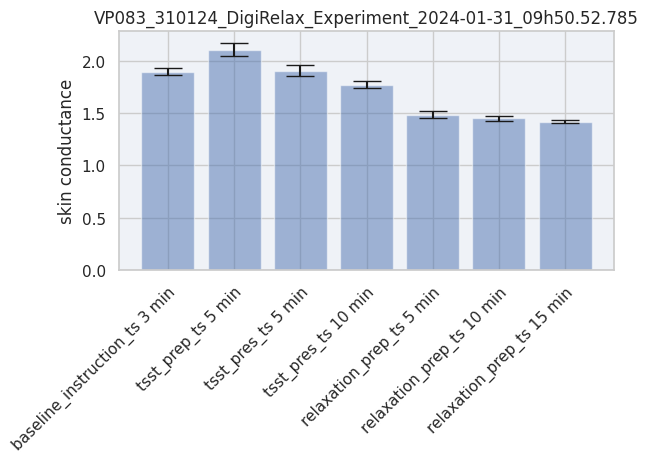

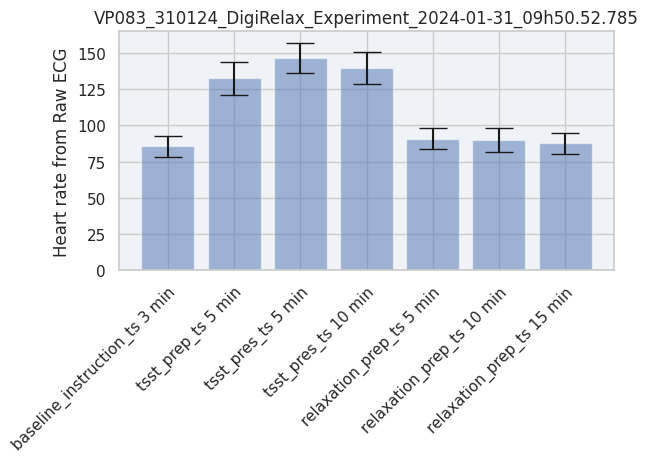

VP084_310124_DigiRelax_Experiment_2024-01-31_13h14.59.762


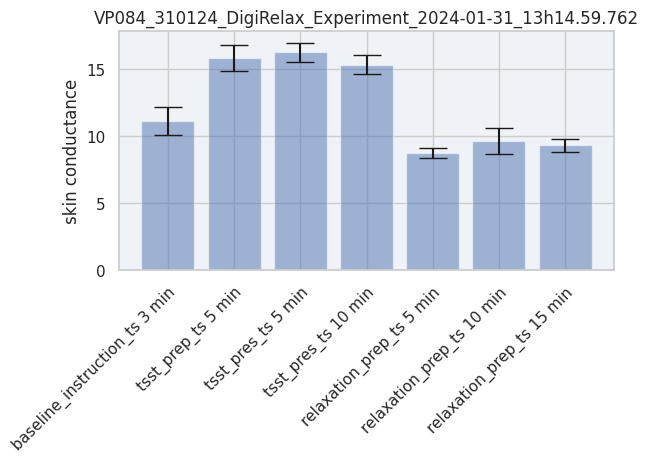

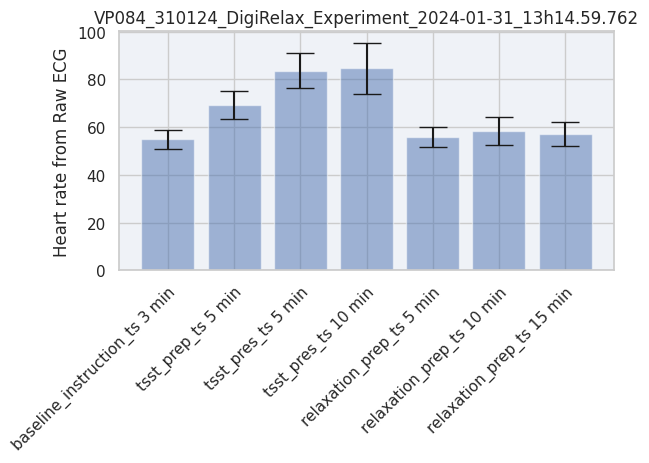

VP085_010224_DigiRelax_Experiment_2024-02-01_09h49.30.242


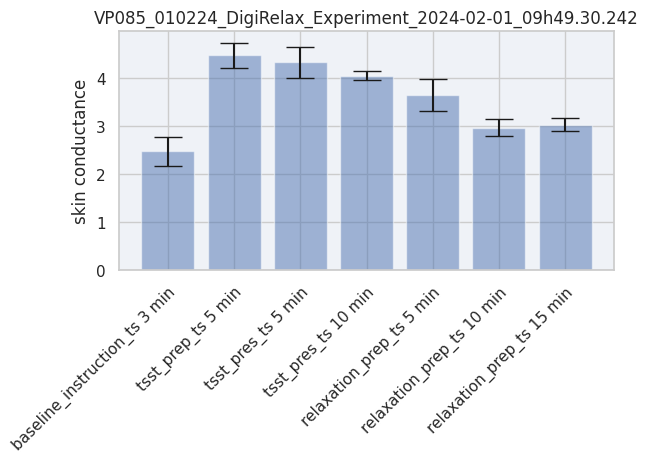

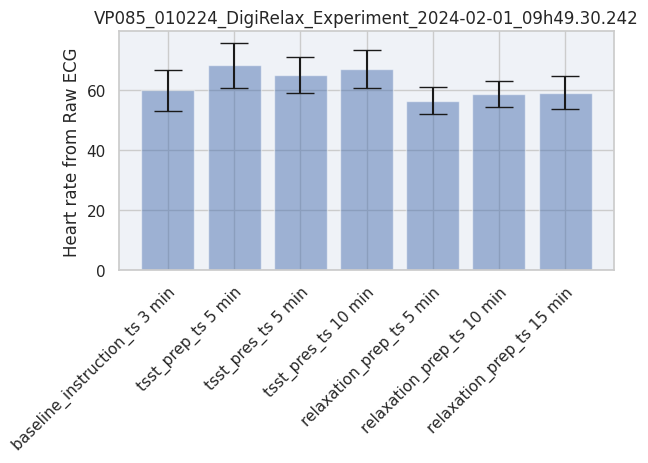

VP086_010224_DigiRelax_Experiment_2024-02-01_14h19.56.788


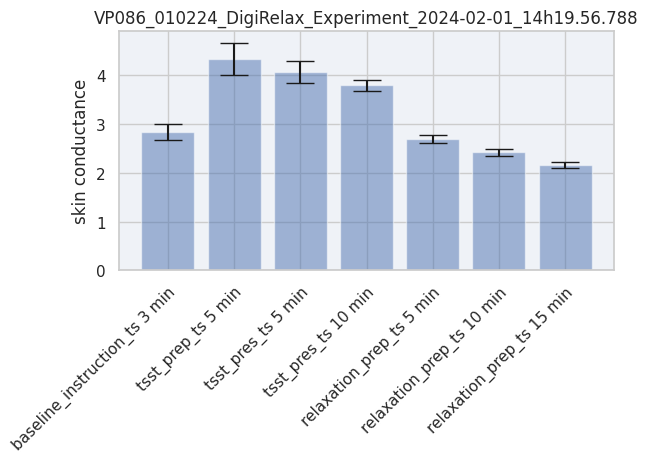

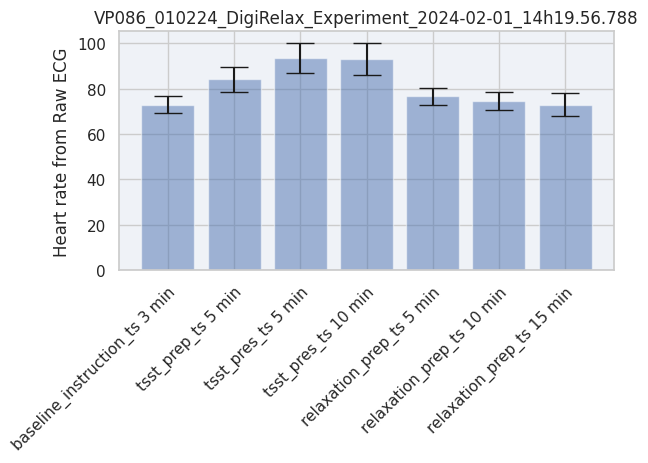

In [25]:
for sub_dir in sub_dirs:
    
    sub_dir_path= os.path.join(data_dir_path, sub_dir)
    psychopy_file_path = os.path.join(sub_dir_path, "Psychopy_data")
    psychopy_file_path = glob.glob(psychopy_file_path+ "/*.csv")[0]
    #print(psychopy_file_path)
    
    shimmer_files_subdir = os.path.join(sub_dir_path, "Shimmer_data")
    
    shimmer_files_subdir_subdir_name = next(os.walk(shimmer_files_subdir))[1][0]
    
    shimmer_files_parent_path = os.path.join(shimmer_files_subdir, shimmer_files_subdir_subdir_name)
    
    shimmer_files_name = glob.glob(shimmer_files_parent_path+ "/*.csv")
    
    for sh_file in shimmer_files_name:
        
        if '_6B1E_' in sh_file:
            hr_shimmer_path = sh_file
            
        elif "_893E_" in sh_file:
            sk_shimmer_path = sh_file
            
            
            
    fol_path, file_name=os.path.split(psychopy_file_path)
    sub_id=file_name[:-4]
    print(sub_id)
    
    ## psychop data
    psychopy_df = read_manipulate_psychopy(psychopy_file_path)
    
    
    ## Skin conductance
    timestamp_sensor_skin = "Shimmer_893E_Timestamp_Unix_CAL"
    conductance_col_name = "Shimmer_893E_GSR_Skin_Conductance_CAL"
    
    sk_cd_df=read_shimmer_sensor(sk_shimmer_path)
    sk_cd_df = standardize_timestamps_shimmer(sk_cd_df, timestamp_sensor_skin)
    sk_cd_df_selected = sk_cd_df[[timestamp_sensor_skin, conductance_col_name]]
    sk_cd_df_selected = sk_cd_df_selected.copy()
    #sk_cd_df_selected=normalize_data (sk_cd_df_selected, conductance_col_name)
    sk_cd_df_selected=normalize_data_min_max (sk_cd_df_selected, conductance_col_name)
    
    ##for normalized data, uncomment the below_line
    
    if designated_folder == "normalized":
        conductance_col_name = "min_max_norm"
    
    mean_sk_cond_list,std_sk_cond_list, x_label_plot_sk =get_mean_std_event_list(psychopy_df, sk_cd_df_selected, event_interest_list_new, offset_min_list_new, timestamp_sensor_skin, conductance_col_name)
    
    fig_sk= plot_mean_std(mean_sk_cond_list, std_sk_cond_list, x_label_plot_sk, sub_id, "skin conductance")
    
    
    
    ## heart rate
    timestamp_hr_col = "Shimmer_6B1E_Timestamp_Unix_CAL"
    hr_col_name = "Shimmer_6B1E_ECGtoHR_LL_RA_CAL"
    
    hr_df=read_shimmer_sensor(hr_shimmer_path)
    hr_df = standardize_timestamps_shimmer(hr_df, timestamp_hr_col)
    
    hr_df_selected = hr_df[[timestamp_hr_col, hr_col_name]]
    hr_df_selected = hr_df_selected.copy()
    
    ###---------------------------------------
    selected_ecg_df = hr_df_selected
    selected_ecg_df['heartrate'] = selected_ecg_df[hr_col_name]
    selected_ecg_df=col_from_str_float(selected_ecg_df, "heartrate")
    ###-------------------------------------------------------

    
    #hr_df_selected=normalize_data (hr_df_selected, hr_col_name)
    hr_df_selected=normalize_data_min_max(hr_df_selected, hr_col_name)
    
    ##for normalized data, uncomment the below_line
    if designated_folder == "normalized":
        hr_col_name = "min_max_norm"
    #hr_col_name="mean_norm"
    
    mean_hr_list,std_hr_list, x_label_plots_hr =get_mean_std_event_list(psychopy_df, hr_df_selected, event_interest_list_new, offset_min_list_new, timestamp_hr_col, hr_col_name)
    
    #vlf_power, lf_power, hf_power, rmsssd_list, mean_hrv_list,std_hrv_list, mean_bpm_list, std_bpm_list, event_interets_plot, all_rr_one_list, all_rr_sublist =get_features_from_ecg(psychopy_df, selected_ecg_df, event_interest_list_new, offset_min_list_new, timestamp_hr_col, "heartrate")
    
    #fig_hrv = plot_mean_std(mean_hrv_list, std_hrv_list, x_label_plots_hr, sub_id, "HRV from Filtered ECG")
    fig_hr=plot_mean_std(mean_hr_list, std_hr_list, x_label_plots_hr, sub_id, "Heart rate from Raw ECG")
    #fig_pb=plot_mean_std(rmsssd_list, 0, x_label_plots_hr, sub_id, "RMSSD")
    
    ### Exporting data----
    
    #export_dict= {"subject_id":sub_id , 'event_interst': x_label_plot_sk, "mean_sk_cond":mean_sk_cond_list , "std_sk_cond": std_sk_cond_list , "mean_bpm_raw": mean_hr_list, 
    #              "std_bpm_raw": std_hr_list,  "mean_bpm":mean_bpm_list,  "std_bpm": std_bpm_list, "mean_hrv": mean_hrv_list, "std_hrv": std_hrv_list, "rmssd": rmsssd_list, 
    #              "vlf_power":vlf_power, "lf_power": lf_power, "hf_power": hf_power}
    
    #dest_path_csv = os.path.join(comp_dest_path,file_name)
    #df_export = pd.DataFrame.from_dict(export_dict)
    #df_export.to_csv(dest_path_csv)
    
    
    ### save skin conductance figure
    
    #sk_file_name = "sk_"+sub_id +".png"
    
    #dest_path_fig_sk = os.path.join(comp_dest_path,sk_file_name)
    
    #fig_sk.savefig(dest_path_fig_sk)